In [1]:
import numpy as np
import matplotlib.pyplot as plt
from merger_analysis import athena_read as ar
from merger_analysis import OrbitAnalysisUtils as ou
from merger_analysis import Constants 
from astropy.io import ascii
import deepdish as dd
from astropy.table import Table
from glob import glob
from mpl_toolkits.axes_grid1 import ImageGrid
from tqdm.auto import tqdm
from skimage import measure
from scipy.interpolate import RegularGridInterpolator
from scipy.interpolate import interp1d
import plotly.graph_objects as go
from scipy.interpolate import NearestNDInterpolator,LinearNDInterpolator
#import pyshtools
from matplotlib.patches import Rectangle
from astropy.modeling import models
from astropy import units as u
import pygyre as pg
from astropy.timeseries import LombScargle
from astropy.table import vstack

c=Constants.Constants()

%matplotlib inline



## reproducibility info
import reproducible
context = reproducible.Context()
context.add_cpu_info()
context.export_yaml('context.txt')

Constants defined...


'a43d52b83bc472e0f280cb755831cba1137d9cda71f00daa4a37d87c6ee5702c'

In [2]:
# Some plotting defaults

fig_mm = 1/25.4
plt.rcParams['figure.figsize'] = (180*fig_mm,150*fig_mm)

# legends
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.borderpad'] = 0.2
plt.rcParams['legend.labelspacing'] = 0.2
plt.rcParams['legend.handletextpad'] = 0.2

# Font sizes
plt.rcParams['axes.labelsize']= 7
plt.rcParams['xtick.labelsize']=7
plt.rcParams['ytick.labelsize']=7
plt.rcParams['legend.fontsize']=7
plt.rcParams['font.size'] = 7

# Font Family
plt.rcParams['font.family']='sans-serif'
plt.rcParams['font.sans-serif']='DejaVu Sans' #, Arial, Helvetica, Lucida Grande, Verdana, Geneva, Lucid, Avant Garde, sans-serif
plt.rcParams['mathtext.fontset']='dejavusans'

# Set line widths
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['grid.linewidth'] = 0.5

# Always save as 'tight'
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['savefig.pad_inches'] = 0.01  # Use virtually all space when we specify figure dimensions


In [3]:
X = 0.73
Z = 0.02
def kappa(rho,T, returnparts=False):
    """From G. Knapp A403 Princeton Course Notes"""
    Kes = 0.2*(1+X)*rho**0 *T**0
    Ke = 0.2*(1+X)*(1+2.7e11*rho/T**2)**(-1) *(1+ (T/4.5e8)**0.86)**(-1)
    Kk = 4.e25*(1+X)*(Z+1.e-3)*rho/T**3.5
    Khm = 1.1e-25*Z**0.5 *rho**0.5 * T**7.7
    Km = 0.1*Z*rho**0 * T**0
    Krad = Km + (Khm**-1 + (Ke+Kk)**-1 )**-1
    if returnparts:
        return Krad, [Kes,Ke,Kk,Khm,Km]
    else:
        return Krad

def get_interp_function(d,var,method='linear'):
    """
    MM: Use RegularGridInterpolator to pass data to interpolating function for a given variable
    Parameters
    -----------
    d : dict
       athena data dict from read_data
    var: str
       name of variable to be interpolated
       
    Returns
    --------
    var_interp: an interpolating function that can be called with a tuple (phi,theta,r)
    """
    dph = np.gradient(d['x3v'])[0]
    two_pi = ( (d['x3v'][-1]-d['x3v'][0]+dph) /(2*np.pi) > 0.99 ) # boolean to determine if spans 2pi in phi
    
    if two_pi:
        x3v = np.append(d['x3v'][0]-dph,d['x3v'])
        x3v = np.append(x3v,x3v[-1]+dph)
        var_data = np.append([d[var][-1]],d[var],axis=0)
        var_data = np.append(var_data,[var_data[0]],axis=0)
    else:
        x3v = d['x3v']
        var_data = d[var]
        
    var_interp = RegularGridInterpolator((x3v,d['x2v'],d['x1v']),var_data,bounds_error=False,method=method)
    return var_interp

def cart_to_polar(x,y,z):
    """cartesian->polar conversion (matches 0<phi<2pi convention of Athena++)
    Parameters
    x, y, z
    Returns
    r, th, phi
    """
    r = np.sqrt(x**2 + y**2 +z**2)
    th = np.arccos(z/r)
    phi = np.arctan2(y,x)
    phi = np.where(phi>=0,phi,phi+2*np.pi)
    return r,th,phi


def get_uniform_meshgrid(lim,npoints=50,center=[0,0,0]):
    """
    MM: define a uniform spacing meshgrid of cartesian points around some center
    Parameters
    ------------
    lim: float
        limit of the box, such that the cartesian box extends +/- lim relative to the center
    center: (3,) array/list of floats
        x,y,z coordinates of the center of the grid
        
    Returns
    -----------
    xx,yy,zz,rr,tt,pp: (npoints,npoints,npoints) arrays of x,y,z and r,theta,phi coordinates of the points
    
    """
    x = np.linspace(-lim,lim,npoints)+center[0]
    y = np.linspace(-lim,lim,npoints)+center[1]
    z = np.linspace(-lim,lim,npoints)+center[2]

    yy,xx,zz = np.meshgrid(y,x,z)
    r,th,ph = cart_to_polar(xx,yy,zz)

    return xx,yy,zz,r,th,ph

def get_marching_cubes_mesh(xx,yy,zz,data,level,step_size=1):
    """ MM: call marching cubes algorithm to get a surface 
    Parameters
    ----------
    xx,yy,zz: (N,N,N) arrays of x,y,z coordinates
    data: (N,N,N) array of floats in which to find surface
    level: float value to construct surface at
    step_size: down sampling of 3D data
    dx: x,y,z spacing of data
    
    Returns
    -------
    verts : (V, 3) array
        Spatial coordinates for V unique mesh vertices. Coordinate order
        matches input `volume` (M, N, P). If ``allow_degenerate`` is set to
        True, then the presence of degenerate triangles in the mesh can make
        this array have duplicate vertices.
    faces : (F, 3) array
        Define triangular faces via referencing vertex indices from ``verts``.
        This algorithm specifically outputs triangles, so each face has
        exactly three indices.
    centroids : (F,3) array
        Centroids of triangular faces
    areas : (F,) array
        areas of triangular faces
    normals : (F,3) array
        face-centered normals 
        
        
    NOTE: 
    assumes uniform spacing in x,y,z
    
    """
    center = np.mean(xx[:,0,0]), np.mean(yy[0,:,0]), np.mean(zz[0,0,:])
    lim = xx[-1,0,0]
    dx = xx[1,0,0]-xx[0,0,0]
    
    verts, faces,_,_ =  measure.marching_cubes_lewiner(data,
                                                       level=level,
                                                       step_size=step_size,
                                                       spacing=[dx,dx,dx])
    verts = verts-lim+center  # recenter the verticies
    
    centroids = mesh_get_centroids(verts,faces)
    areas     = mesh_get_areas(verts,faces)
    normals   = mesh_get_centroid_normals(verts,faces)
    
    mesh = {}
    mesh['verts'] = verts
    mesh['faces'] = faces 
    mesh['centroids'] = centroids
    mesh['areas'] = areas
    mesh['normals'] = normals
    return mesh
    #return verts,faces, centroids, areas, normals

def mesh_get_areas(verts, faces):
    """
    MM: based on skiimage routine "measure.mesh_surface_area()"
    Compute surface area, given vertices & triangular faces
    Parameters
    ----------
    verts : (V, 3) array of floats
        Array containing (x, y, z) coordinates for V unique mesh vertices.
    faces : (F, 3) array of ints
        List of length-3 lists of integers, referencing vertex coordinates as
        provided in `verts`
    Returns
    -------
    areas : (F,3) array of floats
        Surface areas of mesh triangles. Units now [coordinate units] ** 2.
    Notes
    -----
    The arguments expected by this function are the first two outputs from
    `skimage.measure.marching_cubes`. For unit correct output, ensure correct
    `spacing` was passed to `skimage.measure.marching_cubes`.
    This algorithm works properly only if the ``faces`` provided are all
    triangles.
    See Also
    --------
    skimage.measure.marching_cubes
    skimage.measure.marching_cubes_classic
    """
    # Fancy indexing to define two vector arrays from triangle vertices
    actual_verts = verts[faces]
    a = actual_verts[:, 0, :] - actual_verts[:, 1, :]
    b = actual_verts[:, 0, :] - actual_verts[:, 2, :]
    del actual_verts

    # Area of triangle in 3D = 1/2 * Euclidean norm of cross product
    #return ((np.cross(a, b) ** 2).sum(axis=1) ** 0.5).sum() / 2.
    return ((np.cross(a, b) ** 2).sum(axis=1) ** 0.5) / 2.

def mesh_get_centroids(verts,faces):
    """
    MM: from verts, faces, return the coordinates of the centroids
    
    Parameters
    ----------
    verts : (V, 3) array of floats
        Array containing (x, y, z) coordinates for V unique mesh vertices.
    faces : (F, 3) array of ints
        List of length-3 lists of integers, referencing vertex coordinates as
        provided in `verts`
    Returns
    -------
    centroids: (F, 3) array of floats
        array containing (x,y,z) coordinates of triangle centroids    
    """
    return verts[faces].sum(axis=1)/3.


def mesh_get_centroid_normals(verts,faces):
    """
    MM: from verts, faces, return the normals at the centroids
    
    Parameters
    ----------
    verts : (V, 3) array of floats
        Array containing (x, y, z) coordinates for V unique mesh vertices.
    faces : (F, 3) array of ints
        List of length-3 lists of integers, referencing vertex coordinates as
        provided in `verts`
    Returns
    -------
    normals: (F, 3) array of floats
        array containing (x,y,z) components of normal to the plane defined by the vertices of the triangle.     
    """
       # Fancy indexing to define two vector arrays from triangle vertices
    actual_verts = verts[faces]
    a = actual_verts[:, 0, :] - actual_verts[:, 1, :]
    b = actual_verts[:, 0, :] - actual_verts[:, 2, :]
    del actual_verts
    
    # cross product is perpendicular to two vectors connecting vertecies
    cp = np.cross(b, a)
    norms = (cp.T/np.linalg.norm(cp,axis=1)).T
    
    return (cp.T/np.linalg.norm(cp,axis=1)).T

def mesh_interpolate_at_xyzpoints(d,var,points):
    """
    MM: convience function to interpolate a variable to mesh points
    Parameters
    -----------
    d: athena++ data dict
    var: str variable name in, e.g. "rho"
    points: array of cartesian positions (eg vertices or centroids) (N,3) floats N x (x,y,z)
    """
    var_interp = get_interp_function(d,var)
    rp,thp,php = cart_to_polar(points[:,0],points[:,1],points[:,2])
    return var_interp( (php,thp,rp) )




def get_req_func(d,logtau):
    """
    MM: Given a dataset with variable 'tau' defined, compute the radius of the surface of logtau as a function of theta, phi
    ---------------
    d: athena++ data dict (must include tau)
    logtau: the value of logtau to interpolate radius of
    
    returns: 2d function f(theta) for radius of the star. to compute the oblate radius of the donor. 
    """
    Req = np.zeros_like(d['rho'][:,:,0])

    for k in range(len(d['x3v'])):
        for j in range(len(d['x2v'])):
            Req[k,j] = np.interp(logtau, np.flip(np.log10(d['tau'][k,j,:])), np.flip(d['gx1v'][k,j,:]) ) 
            
    ReqAzAvg = np.mean(Req,axis=0)

    return interp1d(d['x2v'],ReqAzAvg,bounds_error=False,fill_value="extrapolate")



def get_req_func_mesh(mymesh):
    r = np.linalg.norm(mymesh['verts'],axis=1)
    R = np.linalg.norm(mymesh['verts'][:,0:2],axis=1)
    z = mymesh['verts'][:,2]
    th = np.arctan(z/R) + np.pi/2

    plt.scatter(th,r)

    thf = np.linspace(0,np.pi,61)
    reqlist = []
    for i in range(len(thf)-1):
        thl = thf[i]
        thr = thf[i+1]
        sel = (th>=thl) & (th<thr)
        myr = np.mean(r[sel])
        reqlist.append([(thl+thr)/2, myr])

    reqlist = np.array(reqlist)

    plt.plot(reqlist[:,0],reqlist[:,1],'C1-')

    return interp1d(reqlist[:,0],reqlist[:,1],bounds_error=False,fill_value="extrapolate")


def h_ld(mu):
    #"""Eddington limb-darkening law (e.g. Pfahl2018 eq 10)"""
    #return 1+1.5*mu
    """solar, cox 2000"""
    return 1 - 0.47*(1-mu) - 0.23*(1-mu)**2 
    

def geff(r,th):
    return np.abs( - c.G*M1/r**2 + Omega_env**2 *r*np.sin(th) )

def Tfactor(xir_o_r,tscale,xir_nl):
    tf = (1+xir_nl*np.tanh(xir_o_r/xir_nl))**tscale
    #tf = (1+xir_o_r)**tscale
    return tf 

def Teff(xir_o_r,r,th,Tpole,tscale=0,xir_nl=100):
    geq_o_gpole = geff(req(th),th)/geff(req(0),0)
    Teq = Tpole * geq_o_gpole**0.25
    return Tfactor(xir_o_r,tscale=tscale,xir_nl=xir_nl)*Teq

def get_Tpole(mesh,Lstar):
    r_faces,th_faces,ph_faces = cart_to_polar(mesh['centroids'][:,0],mesh['centroids'][:,1],mesh['centroids'][:,2])
    geq_o_gpole = geff(req(th_faces),th_faces)/geff(req(0),0)
    Lcalc = np.nansum(mesh['areas']*c.sigmaSB*geq_o_gpole )
    return (Lstar/Lcalc)**0.25

def Luminosity(mesh,Tpole,tscale=0):
    r_centroids,th_centroids,ph_centroids = cart_to_polar( mesh['centroids'][:,0], mesh['centroids'][:,1],mesh['centroids'][:,2])
    xir_o_r = mesh['xir_faces']/req(th_centroids)
    return np.nansum(mesh['areas']*c.sigmaSB*Teff(xir_o_r,r_centroids,th_centroids,Tpole,tscale=tscale)**4)

def BBlam(T,lam):
    return 2*c.h*c.c**2 / lam**5 / (np.exp(c.h*c.c/(lam*c.kB*T))-1)

def BBnu(T,nu):
    return 2*c.h*nu**3/c.c**2 / (np.exp(c.h*nu/(c.kB*T))-1)

def F_lam_integral(mesh,n0,Tpole,lam=5e-5,tscale=0,xir_nl=100):
    """integrate F_lambda over the object surface"""
    r_centroids,th_centroids,ph_centroids = cart_to_polar( mesh['centroids'][:,0], mesh['centroids'][:,1],mesh['centroids'][:,2])
    xir_o_r = mesh['xir_faces']/req(th_centroids)
    ndn_all = np.dot(mesh["normals"],n0)
    ndn = np.where(ndn_all>0,ndn_all,0)
    Teff_centroids = Teff(xir_o_r,r_centroids,th_centroids,Tpole,tscale=tscale,xir_nl=xir_nl)
    get_vlos(mesh,n0)
    f=np.nansum(mesh["areas"]*ndn*h_ld(ndn)*BBlam(Teff_centroids,lam) )
    v=np.nansum(mesh["areas"]*ndn*h_ld(ndn)*BBlam(Teff_centroids,lam)*mesh['vlos_faces'] ) / f
    return f,v 


def get_xir_ml(ml):
    for i,m in enumerate(ml):
        r_verts,th_verts,ph_verts = cart_to_polar(m['verts'][:,0],m['verts'][:,1],m['verts'][:,2])
        r_faces,th_faces,ph_faces = cart_to_polar(m['centroids'][:,0],m['centroids'][:,1],m['centroids'][:,2])

        m['xir_verts']=r_verts-req(th_verts)
        m['xir_faces']=r_faces-req(th_faces)
        
def get_xir(m):
    r_verts,th_verts,ph_verts = cart_to_polar(m['verts'][:,0],m['verts'][:,1],m['verts'][:,2])
    r_faces,th_faces,ph_faces = cart_to_polar(m['centroids'][:,0],m['centroids'][:,1],m['centroids'][:,2])

    m['xir_verts']=r_verts-req(th_verts)
    m['xir_faces']=r_faces-req(th_faces)
        
def get_vlos(m,n0):
    r,th,ph = cart_to_polar(m['verts'][:,0],m['verts'][:,1],m['verts'][:,2])
    vx = np.sin(th)*np.cos(ph)*m['vel1_verts'] + np.cos(th)*np.cos(ph)*m['vel2_verts'] - np.sin(ph)*m['vel3_verts']
    vy = np.sin(th)*np.sin(ph)*m['vel1_verts'] + np.cos(th)*np.sin(ph)*m['vel2_verts'] + np.cos(ph)*m['vel3_verts']
    vz = np.cos(th)*m['vel1_verts'] - np.sin(th)*m['vel2_verts']

    m['vlos_verts'] = -(vx*n0[0] + vy*n0[1] + vz*n0[2])
    m['vlos_faces'] = np.nansum(m['vlos_verts'][m['faces']],axis=1)/3
    return 
        

def get_lc_xi(mesh_fn_list,n0,Tpole,tscale=-1,lam=8e-5,xir_nl=100):
    Jt = []
    for fn in tqdm(mesh_fn_list):
        m = dd.io.load(fn)
        get_xir(m)
        f,v=F_lam_integral(m,n0,Tpole,lam=lam,tscale=tscale,xir_nl=xir_nl)
        Jt.append( [m['time'],f,v])
 
    Jt = Table(np.array(Jt),names=['time','flux','vlos'])
    return Jt



prot [d] = 4.418080823714948
reading orbit file for binary simulation...
tperi =  36460800.0
len(mesh_fn_list) = 700
33000006.0
1.8334038692929877 2.2895284291802027 1.2487856426653607
26.360947078260068 32.91917223839256
Tpole =  32451.209730705443
Tequator = 21390.68182740177
L/Leq =  1.001963450838267


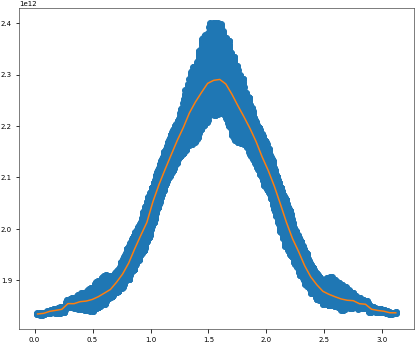

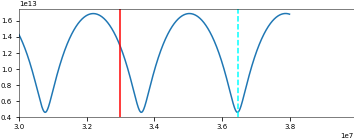

In [4]:
base_dir = "../machoHBdata/hrd/"

M1 = 6.905e+34
Omega_env=1.64601e-05 
print("prot [d] =",2*np.pi/Omega_env / 86400.)

orb = ou.read_trackfile(base_dir+"pm_trackfile.dat")
sel = (orb['time']>33879604.0) & (orb['time']<36990004.0)
tperi = orb[sel]['time'][ np.argmin(orb[sel]['sep']) ]
print('tperi = ',tperi)


mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-9.5.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)

Leq = 4e5*3.846e33

Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()

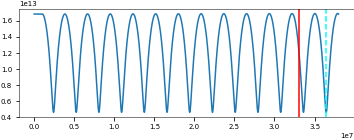

In [5]:
plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
#plt.xlim(3e7,)
plt.show()

In [8]:
min(orb['sep'])/max(orb['vmag']) / 86400

1.1731832799528266

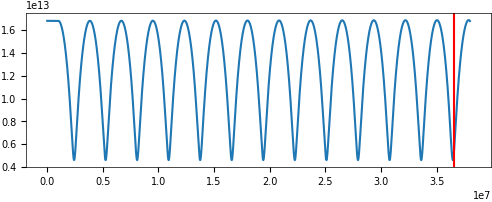

[ 0.84215192 -0.33686077  0.42107596]


In [10]:
m = dd.io.load(base_dir+"mesh_00590_rho1e-9.5.h5")
get_xir(m)
r_verts,th_verts,ph_verts = cart_to_polar(m['verts'][:,0],m['verts'][:,1],m['verts'][:,2])

tscale= -1.0
xir_nl=0.3


#m = ml[123]
#print((m['time']-tperi)/86400.)
plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(m['time'],color='r')
plt.show()


# Observer vector
zf = 2.
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)
print(n0)
camera = dict(
    eye=dict(x=n0[0]*zf, y=n0[1]*zf, z=n0[2]*zf)
)

fig = go.Figure(
    data=[go.Mesh3d(
        x=m["verts"][:,0],
        y=m["verts"][:,1],
        z=m["verts"][:,2],
        i=m["faces"][:,0],
        j=m["faces"][:,1],
        k=m["faces"][:,2],
        #intensity=m['xir_verts']
        intensity=Teff(m['xir_verts']/req(th_verts),r_verts,th_verts,Tpole,tscale=tscale,xir_nl=xir_nl) ,cmin=0,cmax=Tpole
        #intensity=BBlam( Teff(m['xir_verts']/req(th_verts),r_verts,th_verts,Tpole,tscale=tscale), 1e-4)  ,cmin=0 ,cmax=2e15
        #intensity=geff(M1,req(th_verts),th_verts,Omega_env),cmin=0
        #intensity=(1+lscale*m['xir_verts']/req(th_verts))**alpha *geff(M1,req(th_verts),th_verts,Omega_env)/geff(M1,req(0),0,Omega_env),colorscale='magma',cmin=0,cmax=1
        #intensity=np.sqrt(1.35*m['press_verts']/m['rho_verts'])/np.sqrt(c.G*34.5*c.msun/np.linalg.norm(m['verts'],axis=1))
        #intensity=m['r0_verts'],cmin=0,cmax=1
        #intensity=m['temp_verts'],#cmin=0,cmax=3e5
        #intensity=m['xir_verts']/req(np.pi/2),cmin=-0.2,cmax=0.2
        #intensity=m['vel3_verts']/1.e5
        #intensity= 2*np.pi*np.linalg.norm(m['verts'],axis=1)/m['vel3_verts']/86400.,cmin=3,cmax=7
        #intensity=m['vel1_verts']/1.e5, cmin=-20,cmax=20
        #intensity=m['vel1_verts']/np.sqrt(c.kB*m['temp_verts'] / (0.6*c.mp)), cmin=-1,cmax=1
        #intensity=np.log10(np.abs(m['vel1_verts'])/np.sqrt(c.kB*m['temp_verts'] / (0.6*c.mp))),cmin=-2,cmax=2,colorscale='RdBu'
        #intensity=(1+lscale*m['xir_verts']/np.linalg.norm(m['verts'],axis=1))**alpha,cmin=0.8,cmax=1.02,colorscale='YlOrBr_r'

    )])

fig.update_layout(scene_camera=camera)
fig.show()

In [20]:
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)
print ("inclination [deg] = ", 90 - 180/np.pi * np.arctan( n0[2]/np.sqrt(n0[0]**2 + n0[1]**2) ) )

inclination [deg] =  65.09746397445659


# Light Curve

  0%|          | 0/699 [00:00<?, ?it/s]

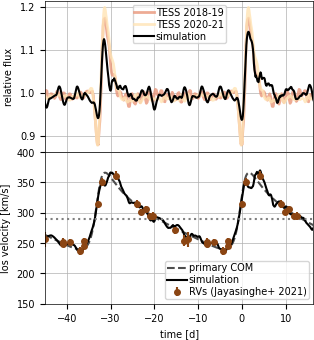

In [30]:
### PARAMS
tscale = -1
xir_nl = 0.3
lam = 8e-5 # 800nm

# Observer vector
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)

Jt = get_lc_xi(mesh_fn_list[1::1],n0,Tpole,tscale=tscale,lam=lam,xir_nl=xir_nl)


#pm = ascii.read("/Users/morganmacleod/Dropbox/CE_princeton/Cooling/Analysis/phoebe_macho_model.dat")

phase = np.array([0.533, 0.806, 0.385, 0.595, 0.627, 0.297, 0.905, 0.270, 0.331, 0.361, 0.756, 0.030, 0.123, 0.871, 0.901, 0.755, 0.998])
RV = np.array([271.0,251.3, 294.7, 254.2, 256.2, 301.2, 245.3, 315.2, 306.8, 294.7, 247.8, 350.9, 360.9, 237.0, 252.8, 251.3, 313.8])
sRV = np.array([5.8, 5.2, 6.2, 9.8, 12.8, 4.9, 4.0, 6.5, 4.5, 4.8, 4.4, 6.9, 7.3, 6.0, 5.3, 6.4, 5.5])
Porb = 32.836 # d
Tyr1 = ascii.read("yr1.csv",names=['phase','flux'])
Tyr3 = ascii.read("yr3.csv",names=['phase','flux'])

#sel1orb = orb['time']<Porb*86400
#tperi = orb['time'][sel1orb][np.argmin(orb['sep'][sel1orb])]

plt.figure(figsize=(88*fig_mm,100*fig_mm))
plt.subplot(211)
fnorm = Jt['flux']/np.mean(Jt['flux'])

plt.plot(Tyr1['phase']*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='TESS 2018-19',alpha=0.8)
plt.plot((Tyr1['phase']-1)*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='',alpha=0.8)
plt.plot(Tyr3['phase']*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='TESS 2020-21',alpha=0.8)
plt.plot((Tyr3['phase']-1)*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='',alpha=0.8)

plt.plot((Jt['time']-tperi)/86400,fnorm,'k-',label='simulation')
plt.xlim(-45,Tyr3['phase'][-1]*Porb)
plt.ylabel('relative flux')
plt.grid()
plt.legend()
plt.xticks(visible=False)

plt.subplot(212)
vprim = -orb['vcom']
vlosp= np.dot(vprim,-n0)
vlos = vlosp + np.interp(orb['time'],Jt['time'],Jt['vlos'])
plt.plot((orb['time']-tperi)/86400,vlosp/1.e5 + 289.4,ls='--',color='0.3',label='primary COM')
plt.plot((orb['time']-tperi)/86400,vlos/1.e5 + 289.4,'k-',label='simulation')
#plt.plot(pm['times'],pm['rvs']+ 289.4)
plt.axhline(289.4,ls=':',color='grey')
#plt.axvline(tperi,ls='--',color='grey')
plt.ylim(150,400)
plt.xlim(-45,Tyr3['phase'][-1]*Porb)
plt.xlabel('time [d]')
plt.ylabel('los velocity [km/s]')
plt.errorbar((phase-1)*Porb,RV,yerr=sRV,linestyle='',marker='o',color='SaddleBrown',label='RVs (Jayasinghe+ 2021)',markersize=4)
plt.errorbar((phase-2)*Porb,RV,yerr=sRV,linestyle='',marker='o',color='SaddleBrown',label='',markersize=4)
plt.errorbar((phase)*Porb,RV,yerr=sRV,linestyle='',marker='o',color='SaddleBrown',label='',markersize=4)

plt.grid()
#plt.xlim(325,)
plt.legend(loc='lower right')

plt.subplots_adjust(hspace=0)
plt.savefig("figs/lcrv.pdf",dpi=300)

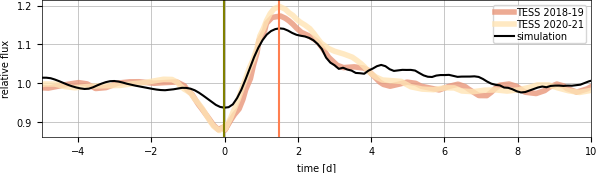

In [40]:
plt.figure(figsize=(180*fig_mm,45*fig_mm))
plt.plot(Tyr1['phase']*Porb, 1+Tyr1['flux'],lw=4,color='DarkSalmon',label='TESS 2018-19',alpha=0.8)
plt.plot(Tyr3['phase']*Porb, 1+Tyr3['flux'],lw=4,color='Moccasin',label='TESS 2020-21',alpha=0.8)
plt.plot((Jt['time']-tperi)/86400,fnorm,'k-',label='simulation')
plt.xlim(-5,10)
plt.xlabel('time [d]')
plt.ylabel('relative flux')
plt.grid()
plt.legend()

plt.axvline(-0.008981481481481481,color='Olive')
plt.axvline(1.495648148148148,color='Coral')
plt.savefig("figs/lc_peri.svg",bbox_inches='tight',dpi=300)

In [39]:
def makesphere(x, y, z, radius, resolution=10):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)


# Observer vector
zf = 1.
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)
camera = dict(
    eye=dict(x=n0[0]*zf, y=n0[1]*zf, z=n0[2]*zf)
)

mesh_fn_list_sel = []
mesh_fn_list_sel.append(mesh_fn_list[577-31])
mesh_fn_list_sel.append(mesh_fn_list[590-31])

for i in tqdm(range(len(mesh_fn_list_sel))):
    print(i,mesh_fn_list_sel[i])
    m = dd.io.load(mesh_fn_list_sel[i])
    print((m['time']-tperi)/86400.)
    get_xir(m)

    x2,y2,z2 = ou.pos_secondary(orb,m['time'])   

    xs,ys,zs=makesphere(x2/c.rsun,y2/c.rsun,z2/c.rsun,4,resolution=100)

       
    r_centroids,th_centroids,ph_centroids = cart_to_polar( m['centroids'][:,0], m['centroids'][:,1],m['centroids'][:,2])
    xir_o_r = m['xir_faces']/req(th_centroids)
    ndn_all = np.dot(m["normals"],n0)
    ndn = np.where(ndn_all>0,ndn_all,0)
    Teff_centroids = Teff(xir_o_r,r_centroids,th_centroids,Tpole,tscale=tscale,xir_nl=xir_nl)
    flux_faces = BBlam(Teff_centroids,8e-5) 
    flux_faces_ld = h_ld(ndn)*flux_faces*8e-5


    fig = go.Figure(
        data=[go.Mesh3d(
            x=m["verts"][:,0]/c.rsun,
            y=m["verts"][:,1]/c.rsun,
            z=m["verts"][:,2]/c.rsun,
            i=m["faces"][:,0],
            j=m["faces"][:,1],
            k=m["faces"][:,2],
            intensity= flux_faces_ld ,
            intensitymode='cell',
            cmin=0,cmax=4.5e15*8e-5,
            colorbar=dict(exponentformat='power',orientation='v',
                          len=0.5,
                          thickness=0.03,thicknessmode='fraction',
                          tickfont=dict(family='Helvetica'),
                          title=dict(text="Flux [erg s<sup>-1</sup> cm<sup>-2</sup>]",side='right')),
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0)
         ),
        go.Surface(x=xs,y=ys,z=zs,
                  showscale=False,
                  surfacecolor=np.ones_like(zs),
                   colorscale='Greys',
                  lighting=dict(ambient=1)),
         ])


    myrange = np.array([-120,120])
    fig.update_layout(scene_camera=camera,
                     scene = dict(
                        xaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        yaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        zaxis = dict(range=myrange*0.35,showgrid=False,showbackground=False,title='',tickvals=[])),
                      scene_aspectmode='manual',
                      scene_aspectratio=dict(x=1,y=1,z=0.35),
                      width=1000,height=700,
                      margin=dict(r=0, l=0, b=0, t=0)
    )
    #fig.show(renderer='png')
    fig.write_image("figs/flux_"+str(i)+".svg")

  0%|          | 0/2 [00:00<?, ?it/s]

0 ../machoHBdata/hrd/mesh_00577_rho1e-9.5.h5
-0.008981481481481481
1 ../machoHBdata/hrd/mesh_00590_rho1e-9.5.h5
1.495648148148148


In [48]:
## Including this for completeness -- this is just composing a composite figure and could be skipped. 
import svgutils as svg
import os

#svg.compose.Figure(180*fig_mm*300,100*fig_mm*300,
#                   svg.compose.SVG("figs/flux_0.svg").scale(1.6).move(-200,320),
#                   svg.compose.SVG("figs/flux_1.svg").scale(1.6).move(500,320),
#                   svg.compose.SVG("figs/lc_peri.svg").scale(4.95),
#                   svg.compose.Text("(a)",700,80,size=28,color='Olive'),
#                   svg.compose.Text("(a)",100,700,size=28,color='Olive'),
#                   svg.compose.Text("(b)",980,400,size=28,color='Coral'),
#                   svg.compose.Text("(b)",980,700,size=28,color='Coral'),
#                   ).save("figs/composite_peri.svg")
# then some manual re-position of colorbar is needed in inkscape. 

os.system("/Applications/Inkscape.app/Contents/MacOS/inkscape --export-pdf=figs/composite_peri.pdf figs/composite_peri.svg")

** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823: Invalid glyph found, continuing...
** Message: 12:59:56.823

0

  0%|          | 0/3 [00:00<?, ?it/s]

0 ../machoHBdata/hrd/mesh_00562
-1.7452777777777777
1 ../machoHBdata/hrd/mesh_00573
-0.47217592592592594
2 ../machoHBdata/hrd/mesh_00587
1.1485185185185185


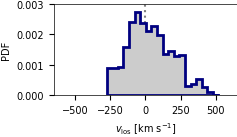

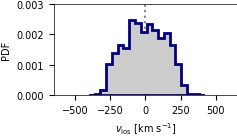

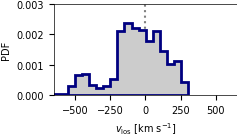

In [34]:
def makesphere(x, y, z, radius, resolution=10):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)

def get_vlos_verts(m):
    r,th,ph = cart_to_polar(m['verts'][:,0],m['verts'][:,1],m['verts'][:,2])
    vx = np.sin(th)*np.cos(ph)*m['vel1_verts'] + np.cos(th)*np.cos(ph)*m['vel2_verts'] - np.sin(ph)*m['vel3_verts']
    vy = np.sin(th)*np.sin(ph)*m['vel1_verts'] + np.cos(th)*np.sin(ph)*m['vel2_verts'] + np.cos(ph)*m['vel3_verts']
    vz = np.cos(th)*m['vel1_verts'] - np.sin(th)*m['vel2_verts']

    m['vlos_verts'] = -(vx*n0[0] + vy*n0[1] + vz*n0[2])
    return 


# Observer vector
zf = 1.1
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)
camera = dict(
    eye=dict(x=n0[0]*zf, y=n0[1]*zf, z=n0[2]*zf)
)

vlim=350

tl = []

fn_root_list = []
fn_root_list.append("../machoHBdata/hrd/mesh_00562")
fn_root_list.append("../machoHBdata/hrd/mesh_00573")
fn_root_list.append("../machoHBdata/hrd/mesh_00587")
#mesh_fn_list_sel.append(mesh_fn_list[588-31])

for i in tqdm(range(len(fn_root_list))):
    print(i,fn_root_list[i])
    
    m = dd.io.load(fn_root_list[i]+"_rho1e-9.5.h5")
    print((m['time']-tperi)/86400.)
    tl.append(np.round((m['time']-tperi)/86400.,2))
    get_xir(m)
    get_vlos_verts(m)
    
    m11 = dd.io.load(fn_root_list[i]+"_rho1e-11.0.h5")
    get_vlos_verts(m11)
    
    m12 = dd.io.load(fn_root_list[i]+"_rho1e-12.0.h5")
    get_vlos_verts(m12)

    
    x2,y2,z2 = ou.pos_secondary(orb,m['time'])   
    xs,ys,zs=makesphere(x2/c.rsun,y2/c.rsun,z2/c.rsun,4,resolution=100)
    


    #r_centroids,th_centroids,ph_centroids = cart_to_polar( m['centroids'][:,0], m['centroids'][:,1],m['centroids'][:,2])
    #xir_o_r = m['xir_faces']/req(th_centroids)
    #ndn_all = np.dot(m["normals"],n0)
    #ndn = np.where(ndn_all>0,ndn_all,0)
    #Teff_centroids = Teff(xir_o_r,r_centroids,th_centroids,Tpole,tscale=tscale,xir_nl=xir_nl)
    #flux_faces = BBlam(Teff_centroids,8e-5) 
    #flux_faces_ld = h_ld(ndn)*flux_faces  


    fig = go.Figure(
        data=[go.Mesh3d(
            x=m["verts"][:,0]/c.rsun,
            y=m["verts"][:,1]/c.rsun,
            z=m["verts"][:,2]/c.rsun,
            i=m["faces"][:,0],
            j=m["faces"][:,1],
            k=m["faces"][:,2],
            #intensity= m['vlos_verts']/1.e5,
            #intensitymode='vertex',
            #cmin=-vlim,cmax=vlim,cauto=False,
            color='Grey',
            opacity=1,
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0)
         ),
        go.Mesh3d(
            x=m11["verts"][:,0]/c.rsun,
            y=m11["verts"][:,1]/c.rsun,
            z=m11["verts"][:,2]/c.rsun,
            i=m11["faces"][:,0],
            j=m11["faces"][:,1],
            k=m11["faces"][:,2],
            intensity= m11['vlos_verts']/1.e5,
            intensitymode='vertex',
            cmin=-vlim,cmax=vlim,cauto=False,
            colorscale='RdBu_r',
            showscale=True,
            opacity=0.9,
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0),
            colorbar=dict(exponentformat='power',orientation='v',
                          len=0.5,
                          thickness=0.03,thicknessmode='fraction',
                          tickfont=dict(family='Helvetica'),
                          title=dict(text="radial velocity [km s<sup>-1</sup>]",side='right'))
         ),
        go.Mesh3d(
            x=m12["verts"][:,0]/c.rsun,
            y=m12["verts"][:,1]/c.rsun,
            z=m12["verts"][:,2]/c.rsun,
            i=m12["faces"][:,0],
            j=m12["faces"][:,1],
            k=m12["faces"][:,2],
            intensity= m12['vlos_verts']/1.e5,
            intensitymode='vertex',
            cmin=-vlim,cmax=vlim,cauto=False,
            showscale=False,
            opacity=0.5,
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0),
            visible=True,
            colorscale='RdBu_r',
         ),
        go.Surface(x=xs,y=ys,z=zs,
                  showscale=False,
                  surfacecolor=np.ones_like(zs),
                   colorscale='Greys',
                  lighting=dict(ambient=1)),
         ])


    myrange = np.array([-160,160])
    fig.update_layout(scene_camera=camera,
                     scene = dict(
                        xaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        yaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        zaxis = dict(range=myrange*0.35,showgrid=False,showbackground=False,title='',tickvals=[])),
                      scene_aspectmode='manual',
                      scene_aspectratio=dict(x=1,y=1,z=0.35),
                      width=500,height=350,
                      margin=dict(r=0, l=0, b=0, t=0)
    )
    #fig.show(renderer='png')
    fig.write_image("figs/vlos_"+str(i)+".svg")

    plt.figure(figsize=(60*fig_mm,30*fig_mm))
    #plt.hist(m['vlos_verts']/1.e5,bins=50,histtype='step',color='k',lw=2,density=True)
    #plt.hist(m11['vlos_verts']/1.e5,bins=20,histtype='step',color='Navy',lw=2,density=True)
    #plt.hist(m12['vlos_verts']/1.e5,bins=20,histtype='step',color='DodgerBlue',lw=1,density=True)
    plt.hist(np.union1d(m11['vlos_verts'],m12['vlos_verts'])/1.e5,bins=20,histtype='stepfilled',edgecolor='Navy',lw=2,
         density=True,facecolor='0.8')
    plt.xlabel(r"$v_{\rm los}$ [km s$^{-1}$]")
    plt.ylabel('PDF')
    plt.axvline(0,color='grey',ls=':',zorder=0)
    #plt.yscale('log')
    #plt.yticks(visible=False)
    plt.ylim(0,0.003)
    plt.xlim(-650,650)
    plt.savefig("figs/vlos_hist_"+str(i)+".svg")
    

In [50]:
#svg.compose.Figure(1520,490,
#                   svg.compose.SVG("figs/vlos_0.svg").scale(1.4).move(10,-130),
#                   svg.compose.SVG("figs/vlos_1.svg").scale(1.4).move(420,-130),
#                   svg.compose.SVG("figs/vlos_2.svg").scale(1.4).move(820,-130),
#                   svg.compose.SVG("figs/vlos_hist_0.svg").scale(2.1).move(30,270),
#                   svg.compose.SVG("figs/vlos_hist_1.svg").scale(2.1).move(510,270),
#                   svg.compose.SVG("figs/vlos_hist_2.svg").scale(2.1).move(990,270),
#                   svg.compose.Text(str(tl[0])+"d",25,50,size=16,color='black'),
#                   svg.compose.Text(str(tl[1])+"d",500,50,size=16,color='black'),
#                   svg.compose.Text(str(tl[2])+"d",980,50,size=16,color='black')
#                  ).save("figs/composite_vlos.svg")


os.system("/Applications/Inkscape.app/Contents/MacOS/inkscape --export-pdf=figs/composite_vlos.pdf figs/composite_vlos.svg")


** Message: 13:03:25.276: Invalid glyph found, continuing...
** Message: 13:03:25.276: Invalid glyph found, continuing...


0

# TEO

In [216]:


def makesphere(x, y, z, radius, resolution=10):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)


# Observer vector
zf = 0.5
n0 = np.array([-1,0.4,0.5])
n0 = n0/np.linalg.norm(n0)
camera = dict(
    eye=dict(x=n0[0]*zf, y=n0[1]*zf, z=n0[2]*zf)
)


mesh_fn_list_sel = ["../machoHBdata/hrd/mesh_00339_rho1e-9.5.h5"]
#mesh_fn_list_sel.append(mesh_fn_list[339-31])

for i in tqdm(range(len(mesh_fn_list_sel))):
    print(i,mesh_fn_list_sel[i])
    m = dd.io.load(mesh_fn_list_sel[i])
    print((m['time']-tperi)/86400.)
    get_xir(m)

    x2,y2,z2 = ou.pos_secondary(orb,m['time'])   

    xs,ys,zs=makesphere(x2/c.rsun,y2/c.rsun,z2/c.rsun,4,resolution=100)

       
    r_centroids,th_centroids,ph_centroids = cart_to_polar( m['centroids'][:,0], m['centroids'][:,1],m['centroids'][:,2])
    xir_o_r = m['xir_faces']/req(th_centroids)
    ndn_all = np.dot(m["normals"],n0)
    ndn = np.where(ndn_all>0,ndn_all,0)
    Teff_centroids = Teff(xir_o_r,r_centroids,th_centroids,Tpole,tscale=tscale,xir_nl=xir_nl)
    flux_faces = BBlam(Teff_centroids,8e-5) 
    flux_faces_ld = h_ld(ndn)*flux_faces  * 8e-5


    fig = go.Figure(
        data=[go.Mesh3d(
            x=m["verts"][:,0]/c.rsun,
            y=m["verts"][:,1]/c.rsun,
            z=m["verts"][:,2]/c.rsun,
            i=m["faces"][:,0],
            j=m["faces"][:,1],
            k=m["faces"][:,2],
            intensity= flux_faces_ld ,
            intensitymode='cell',
            cmin=0,cmax=4.5e15* 8e-5,
            colorbar=dict(exponentformat='power',orientation='v',
                          len=0.5,
                          thickness=0.03,thicknessmode='fraction',
                          tickfont=dict(family='Helvetica'),
                          bgcolor='white',
                          title=dict(text="Flux [erg s<sup>-1</sup> cm<sup>-2</sup>]",side='right')),
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0)
         ),
        go.Surface(x=xs,y=ys,z=zs,
                  showscale=False,
                  surfacecolor=np.ones_like(zs),
                   colorscale='Greys',
                  lighting=dict(ambient=1)),
         ])


    myrange = np.array([-120,120])
    fig.update_layout(scene_camera=camera,
                     scene = dict(
                        xaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        yaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        zaxis = dict(range=myrange*0.35,showgrid=False,showbackground=False,title='',tickvals=[])),
                      scene_aspectmode='manual',
                      scene_aspectratio=dict(x=1,y=1,z=0.35),
                      width=500,height=350,
                      margin=dict(r=0, l=0, b=0, t=0)
    )
    #fig.show(renderer='png')
    fig.write_image("figs/flux_teo.svg")

  0%|          | 0/1 [00:00<?, ?it/s]

0 ../machoHBdata/hrd/mesh_00339_rho1e-9.5.h5
-27.55550925925926


In [218]:
# Observer vector
zf = 0.5
n0 = np.array([-1,0.4,0.5])
n0 = n0/np.linalg.norm(n0)
camera = dict(
    eye=dict(x=n0[0]*zf, y=n0[1]*zf, z=n0[2]*zf)
)


mesh_fn_list_sel = ["../machoHBdata/hrd/mesh_00339_rho1e-9.5.h5"]
#mesh_fn_list_sel.append(mesh_fn_list[339-31])

for i in tqdm(range(len(mesh_fn_list_sel))):
    print(i,mesh_fn_list_sel[i])
    m = dd.io.load(mesh_fn_list_sel[i])
    print((m['time']-tperi)/86400.)
    get_xir(m)

    x2,y2,z2 = ou.pos_secondary(orb,m['time'])   

    xs,ys,zs=makesphere(x2/c.rsun,y2/c.rsun,z2/c.rsun,4,resolution=100)


    fig = go.Figure(
        data=[go.Mesh3d(
            x=m["verts"][:,0]/c.rsun,
            y=m["verts"][:,1]/c.rsun,
            z=m["verts"][:,2]/c.rsun,
            i=m["faces"][:,0],
            j=m["faces"][:,1],
            k=m["faces"][:,2],
            intensity= m['vel1_verts']/1.e5,
            intensitymode='vertex',
            cmin=-60,cmax=60,cauto=False,
            colorscale='PuOr',
            colorbar=dict(exponentformat='power',orientation='v',
                          len=0.5,
                          thickness=0.03,thicknessmode='fraction',
                          tickfont=dict(family='Helvetica'),
                          bgcolor='white',
                          title=dict(text="radial velocity [km s<sup>-1</sup>]",side='right')),
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0)
         ),
        go.Surface(x=xs,y=ys,z=zs,
                  showscale=False,
                  surfacecolor=np.ones_like(zs),
                   colorscale='Greys',
                  lighting=dict(ambient=1)),
         ])


    myrange = np.array([-120,120])
    fig.update_layout(scene_camera=camera,
                     scene = dict(
                        xaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        yaxis = dict(range=myrange,showgrid=False,showbackground=False,title='',tickvals=[]),
                        zaxis = dict(range=myrange*0.35,showgrid=False,showbackground=False,title='',tickvals=[])),
                      scene_aspectmode='manual',
                      scene_aspectratio=dict(x=1,y=1,z=0.35),
                      width=500,height=350,
                      margin=dict(r=0, l=0, b=0, t=0)
    )
    #fig.show(renderer='png')
    fig.write_image("figs/vr_teo.svg")
#fig.show()

  0%|          | 0/1 [00:00<?, ?it/s]

0 ../machoHBdata/hrd/mesh_00339_rho1e-9.5.h5
-27.55550925925926


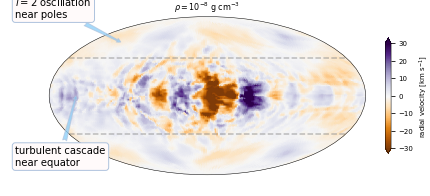

In [237]:


def get_sph_spec(m,nt=100,var='vel1_verts'):
    rverts,thverts,phverts = cart_to_polar(m['verts'][:,0],m['verts'][:,1],m['verts'][:,2])
    
    thsel =  thverts[~np.isnan(thverts)]
    phsel =  phverts[~np.isnan(phverts)]
    datasel     = m[var][~np.isnan(thverts)]

    #interp_data = NearestNDInterpolator(list(zip(thvertsclean,phvertsclean)),data1clean)
    interp_data = NearestNDInterpolator(list(zip(thsel,phsel)),datasel)

    th = np.linspace(0,np.pi,nt)
    ph = np.linspace(0,2*np.pi,2*nt)

    TT,PP = np.meshgrid(th,ph)

    datasurf = interp_data(TT,PP)
    """
    plt.pcolormesh(PP,TT,datasurf)
    plt.colorbar()
    plt.show()"""
    
    gd = pyshtools.SHGrid.from_array(datasurf.T)
    clm = gd.expand(lmax_calc=10)
    return TT,PP, datasurf, clm



## example
m = dd.io.load("../machoHBdata/hrd/mesh_00339_rho1e-8.0.h5")
TT,PP,datasurf,clm = get_sph_spec(m,var='vel1_verts',nt=300)
#clm.plot_spectrum()
#clm.plot_spectrum2d()

plt.figure(figsize=(180*fig_mm,90*fig_mm))
plt.subplot(111, projection="mollweide")
plt.pcolormesh(PP-np.pi,TT-np.pi/2,
               datasurf/1.e5,
               cmap=plt.cm.PuOr,
               vmin=-30,vmax=30,shading='gouraud',rasterized=True)
plt.axhline(np.pi/5,ls='--',color='Grey',alpha=0.5)
plt.axhline(-np.pi/5,ls='--',color='Grey',alpha=0.5)
plt.xticks(visible=False)
plt.yticks(visible=False)
cb=plt.colorbar(label=r"radial velocity [km s$^{-1}$]",extend='both',shrink=0.6)
cb.solids.set_edgecolor('face')
#plt.show()
plt.title(r"$\rho=10^{-8}$ g cm$^{-3}$",size=8)
plt.annotate('turbulent cascade\nnear equator',xy=(0.15,0.4),xytext=(0.03,0.12),xycoords='figure fraction',
             arrowprops=dict(arrowstyle='fancy',edgecolor='LightSteelBlue',facecolor='LightSkyBlue',alpha=0.75),
            bbox=dict(boxstyle='round',facecolor='Snow',edgecolor='LightSteelBlue'))
plt.annotate('$l=2$ oscillation\nnear poles',xy=(0.24,0.6),xytext=(0.03,0.7),xycoords='figure fraction',
             arrowprops=dict(arrowstyle='fancy',edgecolor='LightSteelBlue',facecolor='LightSkyBlue',alpha=0.75),
            bbox=dict(boxstyle='round',facecolor='Snow',edgecolor='LightSteelBlue'))

plt.savefig("figs/teo_rv_annotated.svg")

In [238]:
svg.compose.Figure(1000,750,
                   svg.compose.SVG("figs/flux_teo.svg").scale(1).move(-30,-50),
                   svg.compose.SVG("figs/vr_teo.svg").scale(1).move(470,-50),
                   svg.compose.SVG("figs/teo_rv_annotated.svg").scale(2.3).move(0,270),
                  ).save("figs/composite_teo.svg")


os.system("/Applications/Inkscape.app/Contents/MacOS/inkscape --export-pdf=figs/composite_teo.pdf figs/composite_teo.svg")


0

# Slice Figures

In [234]:
Porb = 32.836*(86400)
base_dir = "../machoHBdata/hrd/"
orb = ou.read_trackfile(base_dir+"pm_trackfile.dat")
sel = (orb['time']>33879604.0) & (orb['time']<36990004.0)
tperi = orb[sel]['time'][ np.argmin(orb[sel]['sep']) ]
print('tperi = ',tperi)

reading orbit file for binary simulation...
tperi =  36460800.0


read_data...reading file ../machoHBdata/hrd/HSE.out1.00440.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00570.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00590.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00630.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...


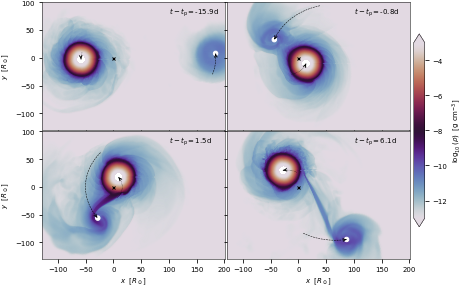

In [247]:

filelist = [base_dir + "HSE.out1.00440.athdf",
            base_dir + "HSE.out1.00570.athdf",
           base_dir + "HSE.out1.00590.athdf",
           base_dir + "HSE.out1.00630.athdf"]

thind = 0
mylevel = None
x2slicevalue=ou.get_midplane_theta(filelist[0],level=mylevel)

#fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(13,7.9),
#                      sharey=True,sharex=True)
fig = plt.figure(figsize=(180*fig_mm,120*fig_mm))
grid = ImageGrid(fig,111,nrows_ncols=[2,2],
                 cbar_location="right",
                 cbar_mode="single",
                 cbar_size='3%',
                 cbar_pad=0.05)


r0thresh = 0.

def add_arrow(line, position=None, direction='right', size=15, color=None):
    """
    add an arrow to a line.

    line:       Line2D object
    position:   x-position of the arrow. If None, mean of xdata is taken
    direction:  'left' or 'right'
    size:       size of the arrow in fontsize points
    color:      if None, line color is taken.
    """
    line = line[0]
    if color is None:
        color = line.get_color()

    xdata = line.get_xdata()
    ydata = line.get_ydata()

    if position is None:
        position = xdata[-2] #xdata.mean()
    # find closest index
    start_ind = np.argmin(np.absolute(xdata - position))
    if direction == 'right':
        end_ind = start_ind + 1
    else:
        end_ind = start_ind - 1

    line.axes.annotate('',
        xytext=(xdata[start_ind], ydata[start_ind]),
        xy=(xdata[end_ind], ydata[end_ind]),
        arrowprops=dict(arrowstyle="->", color=color),
        size=size
    )

    


for i,myfile in enumerate(filelist):
    d = ou.read_data(myfile,orb,gamma=1.35,level=mylevel,x2_min=x2slicevalue,x2_max=x2slicevalue,
                       get_energy=False,profile_file=base_dir+'hse_profile.dat')

    x2,y2,z2 = ou.pos_secondary(orb,d['Time'])

    rcom,vcom = ou.rcom_vcom(orb,d['Time'])
    
    
    ### DENSITY
    im=grid[i].pcolormesh( ou.get_plot_array_midplane(d['x'][:,thind,:]-rcom[0])/c.rsun, 
                           ou.get_plot_array_midplane(d['y'][:,thind,:] -rcom[1])/c.rsun,
                           ou.get_plot_array_midplane(np.where(d['r0'][:,thind,:]>r0thresh, np.log10((d['r0']*d['rho'])[:,thind,:]),np.nan ) ),
               cmap='twilight',vmin=-13,vmax=-3,shading='gouraud',rasterized=True,zorder=0
            )
    #cb=grid.cbar_axes[0].colorbar(im,extend='both')
    cb=plt.colorbar(im,extend='both',cax=grid.cbar_axes[0],label=r'$\log_{10}\left( \rho \right)$  [g cm$^{-3}$]')
    #cb.set_label_text(r'$\log_{10}\left( \rho \right)$  [g cm$^{-3}$]')
    cb.solids.set_edgecolor('face')
    
    grid[i].annotate(r"$t-t_{\rm p}=$"+str(round((d['Time']-tperi)/86400.,1))+"d", (100,80),fontsize=7)
    
    grid[i].add_patch(plt.Circle([(x2-rcom[0])/c.rsun,(y2-rcom[1])/c.rsun],radius=4,color='white') )
        #grid[i].plot((x2-rcom[0])/c.rsun,(y2-rcom[1])/c.rsun,'wo',markersize=12,zorder=1,markeredgecolor='k')
    grid[i].set_ylim(-9e12/c.rsun,7e12/c.rsun)
    grid[i].set_xlim(-9e12/c.rsun,1.4e13/c.rsun)
    sel = (orb['time']>d['Time']-Porb/10) & (orb['time']<=d['Time'])
    l2 = grid[i].plot((orb[sel]['x']-orb[sel]['xcom'])/c.rsun,(orb[sel]['y']-orb[sel]['ycom'])/c.rsun,'k--',lw=0.5)
    l1 = grid[i].plot(-orb[sel]['xcom']/c.rsun,-orb[sel]['ycom']/c.rsun,'k:',lw=0.5)
    grid[i].plot([0],[0],'kx',markersize=3)
    add_arrow(l2,size=6)
    add_arrow(l1,size=6)
    grid[i].set_xlabel('$x \ \ [R_\odot]$')
    grid[i].set_ylabel('$y \ \ [R_\odot]$')
    
plt.savefig("figs/orbit_wide.pdf",dpi=300)

In [12]:
def divV_midplane(d):
    divV = ( d['gx1v']**(-2) *  np.gradient(d['gx1v']**2 * d['vel1'],axis=2,edge_order=2)/np.gradient(d['gx1v'],axis=2,edge_order=2) +
         #1/(d['gx1v']*np.sin(d['gx2v'])) *  np.gradient(np.sin(d['gx2v']) *d['vel2'],axis=1)/np.gradient(d['gx2v'],axis=1) +
         1/(d['gx1v']*np.sin(d['gx2v'])) *  np.gradient(d['vel3'],axis=0,edge_order=2)/np.gradient(d['gx3v'],axis=0,edge_order=2) )
    return divV

def vorticity_midplane(d):
    """phi component of vorticity"""
    vortth = 1/d['gx1v']*(1/np.sin(d['gx2v'])*np.gradient(d['vel1'],axis=0,edge_order=2)/np.gradient(d['gx3v'],axis=0,edge_order=2) - np.gradient(d['gx1v']*d['vel3'],axis=2,edge_order=2)/np.gradient(d['gx1v'],axis=2,edge_order=2) )
    vortz = - np.sin(d['gx2v'])*vortth
    return vortz

In [249]:
filelist = [base_dir+"HSE.out1.00575.athdf",
            base_dir+"HSE.out1.00580.athdf",
            base_dir+"HSE.out1.00590.athdf"]

mylevel=3
x2slicevalue=ou.get_midplane_theta(filelist[0],level=mylevel)

dl = []
for i,myfile in enumerate(filelist):
    dlev = []
    for ll in [0,1,2,3]:
        d = ou.read_data(myfile,orb,gamma=1.35,level=ll,x2_min=x2slicevalue,x2_max=x2slicevalue,
                           get_energy=False,profile_file=base_dir+'hse_profile.dat',x1_max=1e13)


        d['divV'] = divV_midplane(d)
        d['mach'] = np.sqrt( (d['vel1']**2 + d['vel2']**2 + d['vel3']**2) / (1.35*d['press']/d['rho']))
        d['mach_radial'] = np.sqrt( d['vel1']**2 / (1.35*d['press']/d['rho']))
        d['vort'] = vorticity_midplane(d)
        dlev.append(d)
    dl.append(dlev)

read_data...reading file ../machoHBdata/hrd/HSE.out1.00575.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00575.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00575.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00575.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00580.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00580.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00580.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
..

<ipython-input-250-ea8b0ba082b5>:25: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.

<ipython-input-250-ea8b0ba082b5>:49: RuntimeWarning:

invalid value encountered in log

<ipython-input-250-ea8b0ba082b5>:46: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



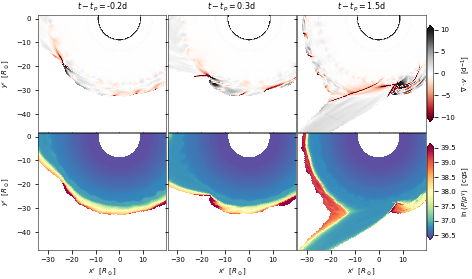

In [250]:
#filelist = [base_dir+"HSE.out1.00585.athdf",
#            base_dir+"HSE.out1.00590.athdf",
#            base_dir+"HSE.out1.00600.athdf"]

rhocontour = [-9.5]

lim=1.7e12
limr=5e12
centerx = -0.5e12
centery = -1.6e12

fig = plt.figure(figsize=(180*fig_mm,150*fig_mm))
grid = ImageGrid(fig,111,nrows_ncols=[2,3],
                 cbar_mode="edge",cbar_location='right')



for i,dlev in enumerate(dl):
    d=dlev[2].copy()
    x2,y2,z2 = ou.pos_secondary(orb,d['Time'])
    rcom,vcom = ou.rcom_vcom(orb,d['Time'])

    ind = i
    for ll in [0,1,2,3]:
        im2=grid[ind].pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where((dlev[ll]['Levels'][:,0,:] == ll) & (np.log10(dlev[ll]['rho'][:,0,:])>rhocontour),
                                              (dlev[ll]['divV'][:,0,:])*86400,
                                             np.nan)),
                    cmap='RdGy',shading='nearest',rasterized=True,vmin=-10,vmax=10  )
    
    
    cb2=plt.colorbar(im2,extend='both',cax=grid.cbar_axes[0],label=r'$\nabla \cdot v$  [d$^{-1}$] ')
    cb2.solids.set_edgecolor('face')

    grid[ind].add_patch(plt.Circle([x2/c.rsun,y2/c.rsun],radius=4,color='black') )
    grid[ind].set_xlim((centerx-1.1*lim)/c.rsun,(centerx+1.1*lim)/c.rsun)
    grid[ind].set_ylim((centery-lim)/c.rsun,(centery+lim)/c.rsun)

    grid[ind].set_xlabel("$x' \ \ [R_\odot]$")
    grid[ind].set_ylabel("$y' \ \ [R_\odot]$")
    grid[ind].set_title(r"$t-t_{p}=$"+str(np.round((d['Time']-tperi)/86400.,1))+'d' ,fontdict={'fontsize':8}  )

        
    ind = i+3
    im1=grid[ind].pcolormesh(ou.get_plot_array_midplane(dlev[2]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[2]['y'][:,0,:])/c.rsun,
                   #np.log10(d['rho'][:,0,:])) 
                   ou.get_plot_array_midplane(np.log(np.where(np.log10(dlev[2]['rho'][:,0,:])>rhocontour,dlev[2]['press'][:,0,:]/dlev[2]['rho'][:,0,:]**1.35,-99))),
                   cmap='Spectral_r',shading='nearest',vmin=36.5,vmax=39.5,rasterized=True)
    cb=plt.colorbar(im1,extend='both',cax=grid.cbar_axes[1],label=r'$\ln\left( P/\rho^{\gamma} \right)$  [cgs]')
    cb.solids.set_edgecolor('face')

    grid[ind].add_patch(plt.Circle([x2/c.rsun,y2/c.rsun],radius=4,color='black') )
    grid[ind].set_xlim((centerx-1.1*lim)/c.rsun,(centerx+1.1*lim)/c.rsun)
    grid[ind].set_ylim((centery-lim)/c.rsun,(centery+lim)/c.rsun)

    grid[ind].set_xlabel("$x' \ \ [R_\odot]$")
    grid[ind].set_ylabel("$y' \ \ [R_\odot]$")
    

plt.savefig("figs/shock_peri_lower.pdf",dpi=300,bbox_inches='tight')

<ipython-input-252-63bbc5b1d4fd>:31: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



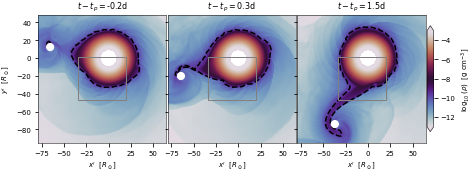

In [252]:
#filelist = [base_dir+"HSE.out1.00585.athdf",
#            base_dir+"HSE.out1.00590.athdf",
#            base_dir+"HSE.out1.00600.athdf"]


rhocontour = [-9.5]

limr=5e12
centerx = -0.5e12
centery = -1.6e12

fig = plt.figure(figsize=(180*fig_mm,750*fig_mm))
grid = ImageGrid(fig,111,nrows_ncols=[1,3],
                 cbar_mode="edge",cbar_location='right')


#for i,myfile in enumerate(filelist):
    #d = ou.read_data(myfile,orb,gamma=1.35,level=mylevel,x2_min=x2slicevalue,x2_max=x2slicevalue,
    #                   get_energy=False,profile_file=base_dir+'hse_profile.dat')
    
    #d['divV'] = divV_midplane(d)
    #d['mach'] = np.sqrt( (d['vel1']**2 + d['vel2']**2 + d['vel3']**2) / (1.35*d['press']/d['rho']))
    #d['mach_radial'] = np.sqrt( d['vel1']**2 / (1.35*d['press']/d['rho']))

for i,dlev in enumerate(dl):
    d=dlev[2].copy()
    x2,y2,z2 = ou.pos_secondary(orb,d['Time'])
    rcom,vcom = ou.rcom_vcom(orb,d['Time'])

    ind = i
    im0=grid[ind].pcolormesh(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                   #np.log10(d['rho'][:,0,:])) 
                   ou.get_plot_array_midplane(np.log10(np.where(d['r0'][:,0,:]>0,d['rho'][:,0,:],-99))),
                   cmap='twilight',vmin=-13,vmax=-3,shading='nearest',rasterized=True)
    cb=plt.colorbar(im0,extend='both',cax=grid.cbar_axes[0],label=r'$\log_{10}\left(\rho\right)$  [g cm$^{-3}$]')
    cb.solids.set_edgecolor('face')
    
    grid[ind].contour(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(np.log10(d['rho'][:,0,:]) ),
                   levels=rhocontour,colors='k',linestyles='--',zorder=1)

    grid[ind].add_patch(plt.Circle([x2/c.rsun,y2/c.rsun],radius=4,color='white') )
    grid[ind].set_xlim((centerx-limr)/c.rsun,(centerx+limr)/c.rsun)
    grid[ind].set_ylim((centery-limr)/c.rsun,(centery+limr)/c.rsun)

    grid[ind].set_xlabel("$x' \ \ [R_\odot]$")
    grid[ind].set_ylabel("$y' \ \ [R_\odot]$")
    grid[ind].set_title(r"$t-t_{p}=$"+str(np.round((d['Time']-tperi)/86400.,1))+'d' ,fontdict={'fontsize':8}  )
    grid[ind].add_patch(Rectangle(((centerx-1.1*lim)/c.rsun,(centery-lim)/c.rsun),2.2*lim/c.rsun,2*lim/c.rsun,linewidth=1,edgecolor='grey',facecolor='none'))

plt.savefig("figs/shock_peri_upper.pdf",dpi=300,bbox_inches='tight')

In [13]:
filelist = [base_dir+"HSE.out1.00630.athdf"]

dl = []
for i,myfile in enumerate(filelist):
    dlev = []
    for ll in [0,1,2,3]:
        x2slicevalue=ou.get_midplane_theta(filelist[0],level=ll)
        d = ou.read_data(myfile,orb,gamma=1.35,level=ll,x2_min=x2slicevalue,x2_max=x2slicevalue,
                           get_energy=False,profile_file=base_dir+'hse_profile.dat',x1_max=1e13)


        d['divV'] = divV_midplane(d)
        d['mach'] = np.sqrt( (d['vel1']**2 + d['vel2']**2 + d['vel3']**2) / (1.35*d['press']/d['rho']))
        d['mach_radial'] = np.sqrt( d['vel1']**2 / (1.35*d['press']/d['rho']))
        d['vort'] = vorticity_midplane(d)
        dlev.append(d)
    dl.append(dlev)

read_data...reading file ../machoHBdata/hrd/HSE.out1.00630.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00630.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00630.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/HSE.out1.00630.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...


<ipython-input-259-fd3d674a0bdd>:3: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



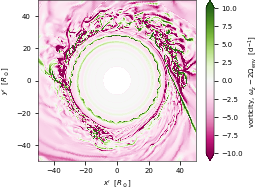

In [259]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
for ll in [0,1,2,3]:
    plt.pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where(dlev[ll]['Levels'][:,0,:] == ll,
                                              (dlev[ll]['vort'][:,0,:] -2*Omega_env)*86400,
                                             np.nan)),
                   cmap='PiYG',shading='nearest',rasterized=True,vmin=-10,vmax=10  )

plt.colorbar(extend='both',label=r'vorticity, $\omega_z-2\Omega_{\rm env}$  [d$^{-1}$] ')

plt.xlim(-50,50)
plt.ylim(-50,50)
plt.xlabel("$x' \ \ [R_\odot]$")
plt.ylabel("$y' \ \ [R_\odot]$")
plt.savefig("figs/apo_vort.pdf",dpi=300,bbox_inches='tight')

<ipython-input-260-af9e941d6d9a>:3: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



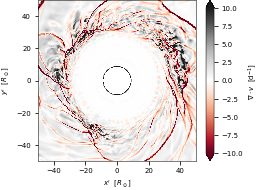

In [260]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
for ll in [0,1,2,3]:
    plt.pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where(dlev[ll]['Levels'][:,0,:] == ll,
                                              (dlev[ll]['divV'][:,0,:])*86400,
                                             np.nan)),
                    cmap='RdGy',shading='nearest',rasterized=True,vmin=-10,vmax=10  )

plt.colorbar(extend='both',label=r'$\nabla \cdot v$  [d$^{-1}$] ')

plt.xlim(-50,50)
plt.ylim(-50,50)
plt.xlabel("$x' \ \ [R_\odot]$")
plt.ylabel("$y' \ \ [R_\odot]$")
plt.savefig("figs/apo_div.pdf",dpi=300,bbox_inches='tight')


<ipython-input-261-55390596d244>:3: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



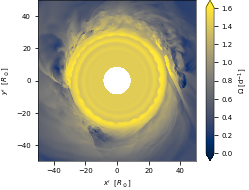

In [261]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
for ll in [0,1,2,3]:
    plt.pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where(dlev[ll]['Levels'][:,0,:] == ll,
                                              (dlev[ll]['vel3']/dlev[ll]['gx1v'])[:,0,:]*86400,
                                             np.nan)),
                    cmap='cividis',shading='nearest',rasterized=True,vmin=0,vmax=1.6   )


plt.colorbar(extend='both',label=r'$\Omega$ [d$^{-1}$]')

plt.xlim(-50,50)
plt.ylim(-50,50)
plt.xlabel("$x' \ \ [R_\odot]$")
plt.ylabel("$y' \ \ [R_\odot]$")
plt.savefig("figs/apo_omega.pdf",dpi=300,bbox_inches='tight')

<ipython-input-262-b00517b1a140>:3: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



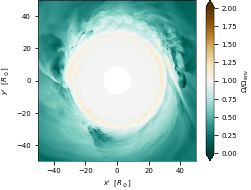

In [262]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
for ll in [0,1,2,3]:
    plt.pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where(dlev[ll]['Levels'][:,0,:] == ll,
                                              (dlev[ll]['vel3']/dlev[ll]['gx1v'])[:,0,:]/Omega_env,
                                             np.nan)),
                    cmap='BrBG_r',shading='nearest',rasterized=True,vmin=0,vmax=2   )



plt.colorbar(extend='both',label=r'$\Omega/\Omega_{\rm env}$')

plt.xlim(-50,50)
plt.ylim(-50,50)
plt.xlabel("$x' \ \ [R_\odot]$")
plt.ylabel("$y' \ \ [R_\odot]$")
plt.savefig("figs/apo_omega_omegaenv.pdf",dpi=300,bbox_inches='tight')

<ipython-input-263-1408e05ea037>:3: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



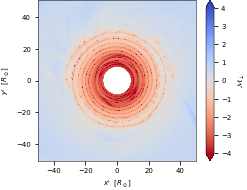

In [263]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
for ll in [0,1,2,3]:
    plt.pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where(dlev[ll]['Levels'][:,0,:] == ll,
                                              ( np.log10(np.abs(dlev[ll]['vel3']-Omega_env*dlev[ll]['gx1v'] )/np.sqrt(1.35*dlev[ll]['press']/dlev[ll]['rho']) ))[:,0,:],
                                             np.nan)),
                  cmap='coolwarm_r',shading='nearest',rasterized=True,vmin=-4,vmax=4   )


plt.colorbar(extend='both',label=r'${\cal M}_\perp$')

plt.axis('equal')
plt.xlim(-50,50)
plt.ylim(-50,50)
plt.xlabel("$x' \ \ [R_\odot]$")
plt.ylabel("$y' \ \ [R_\odot]$")
plt.savefig("figs/apo_machperp.pdf",dpi=300,bbox_inches='tight')

<ipython-input-264-de81a117fe37>:2: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



(-50.0, 50.0)

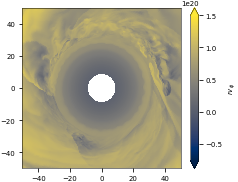

In [264]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
plt.pcolormesh(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                  ( ou.get_plot_array_midplane( d['vel3'] * d['gx1v'])[:,0,:]),
                   cmap='cividis',shading='nearest',rasterized=True,vmax=1.5e20 )
plt.colorbar(extend='both',label=r'$rv_\phi$')

plt.xlim(-50,50)
plt.ylim(-50,50)

/var/folders/42/xrxtlygd0wz0ycr_y5yb1m_40000gn/T/ipykernel_24262/1957984040.py:2: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,


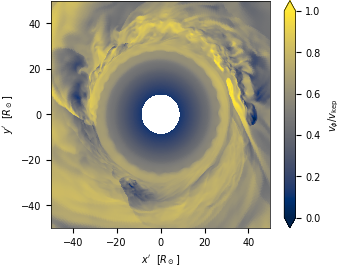

In [14]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
plt.pcolormesh(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( d['vel3']/np.sqrt(c.G*34.5*c.msun/d['gx1v']) )[:,0,:],
                   cmap='cividis',shading='nearest',rasterized=True,vmin=0,vmax=1)
plt.colorbar(extend='both',label=r'$v_\phi/v_{\rm kep}$')

plt.xlim(-50,50)
plt.ylim(-50,50)

plt.xlabel("$x' \ \ [R_\odot]$")
plt.ylabel("$y' \ \ [R_\odot]$")
plt.savefig("figs/vphi_vkep_slice.pdf",bbox_inches='tight',dpi=300)

<ipython-input-266-d2c536b82a15>:2: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



(-50.0, 50.0)

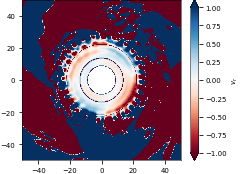

In [266]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
plt.pcolormesh(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                  ( ou.get_plot_array_midplane( d['vel1'])[:,0,:]/1e5),
                   cmap='RdBu',shading='nearest',rasterized=True,vmin=-1, vmax=1 )
plt.colorbar(extend='both',label=r'$v_r$')

plt.xlim(-50,50)
plt.ylim(-50,50)

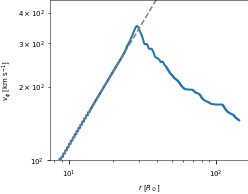

In [268]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))

vel3 = np.mean(d['vel3'][:,0,:],axis=0)

plt.plot(d['x1v']/c.rsun,vel3/1.e5,lw=2)
plt.plot(d['x1v']/c.rsun,d['x1v']*Omega_env/1e5,'--',color='grey')
plt.ylim(100,450)
plt.loglog()
plt.xlabel(r'$r \ [R_\odot]$')
plt.ylabel(r'$v_\phi$ [km s$^{-1}$]')
plt.show()

Text(0, 0.5, '$\\Omega/\\Omega_{\\rm env}$')

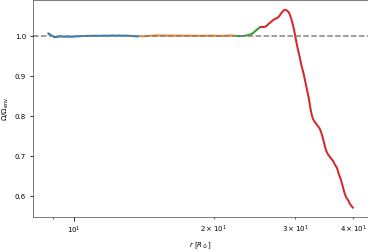

In [269]:
for ll in [0,1,2,3]:
    sel = (dlev[ll]['Levels'][0,0,:]==ll) & (dlev[ll]['x1v']<40*c.rsun)
    plt.plot(dlev[ll]['x1v'][sel]/c.rsun,np.mean((dlev[ll]['vel3']/dlev[ll]['gx1v'])[:,0,:],axis=0)[sel]/Omega_env,lw=2)

plt.axhline(1,ls='--',color='grey')
plt.semilogx()
plt.xlabel(r'$r \ [R_\odot]$')
plt.ylabel(r'$\Omega/\Omega_{\rm env}$')

[]

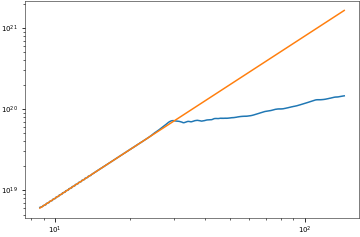

In [270]:
vel3 = np.mean(d['vel3'][:,0,:],axis=0)

plt.plot(d['x1v']/c.rsun,vel3*d['x1v'])
plt.plot(d['x1v']/c.rsun,Omega_env*d['x1v']**2)
plt.loglog()

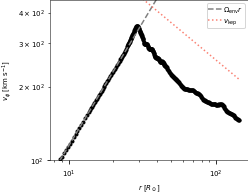

In [274]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
for ll in [0,1,2,3]:
    sel = (dlev[ll]['Levels'][0,0,:]==ll) & (dlev[ll]['x1v']<400*c.rsun)
    plt.plot(dlev[ll]['x1v'][sel]/c.rsun,np.mean((dlev[ll]['vel3']/1e5)[:,0,:],axis=0)[sel],'.',lw=2,color='k')


plt.plot(d['x1v']/c.rsun,d['x1v']*Omega_env/1e5,'--',color='grey',label=r'$\Omega_{\rm env} r$')
plt.plot(d['x1v']/c.rsun,np.sqrt(c.G*34.5*c.msun/d['x1v'])/1e5,':',color='Salmon',label=r'$v_{\rm kep}$' )
plt.ylim(100,450)
plt.loglog()
plt.xlabel(r'$r \ [R_\odot]$')
plt.ylabel(r'$v_\phi$ [km s$^{-1}$]')
plt.legend()
plt.savefig('figs/vphi_vkep_line.pdf',bbox_inches='tight')

phi =  0.0020453078
phi =  0.62790954
phi =  1.2578642
phi =  1.8837285
phi =  2.5136833
phi =  3.1436381
phi =  3.7695022
phi =  4.399457
phi =  5.025321
phi =  5.6552763


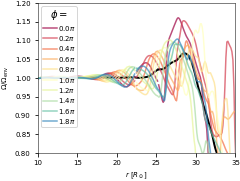

In [276]:
plt.figure(figsize=(90*fig_mm,70*fig_mm))
for ll in [0,1,2,3]:
    sel = (dlev[ll]['Levels'][0,0,:]==ll) & (dlev[ll]['x1v']<40*c.rsun)
    plt.plot(dlev[ll]['x1v'][sel]/c.rsun,np.mean((dlev[ll]['vel3']/dlev[ll]['gx1v'])[:,0,:],axis=0)[sel]/Omega_env
             ,lw=2,color='k')


for iph in np.linspace(0,1,11)[0:-1]:
    print("phi = ",dlev[ll]['x3v'][int(iph*len(dlev[ll]['x3v']))])
    for ll in [0,1,2,3]:
        sel = (dlev[ll]['Levels'][0,0,:]==ll) & (dlev[ll]['x1v']<40*c.rsun)
        plt.plot(dlev[ll]['x1v'][sel]/c.rsun,
                 dlev[ll]['vel3'][int(iph*len(dlev[ll]['x3v'])),0,:][sel]/dlev[ll]['x1v'][sel]/Omega_env,
                color=plt.cm.Spectral(iph),label=np.where(ll==0,str(np.round(2*iph,2))+'$\pi$',''),alpha=0.7)


plt.legend(title=r'$\phi =$',loc='upper left')
#plt.loglog()
plt.xlim(10,35)
plt.ylim(1-0.2,1+0.2)
#plt.axvline(33)

plt.xlabel(r'$r \ [R_\odot]$')
plt.ylabel(r'$\Omega/\Omega_{\rm env}$')

plt.savefig('figs/omega_wave.pdf',bbox_inches='tight')

In [277]:
#dissipation rate

bb = models.BlackBody(temperature=30000*u.K,scale= 1.0*u.erg / (u.cm**2 * u.s * u.AA * u.sr))
ewHbeta = bb(4861 * u.AA)  * 1*u.AA
ewHalpha = bb(6563 * u.AA) * 20*u.AA

wav = np.linspace(1,1e4,10000)*u.AA
tot = np.sum( bb(wav)*(wav[1]-wav[0]) )

print( ewHbeta / tot  )

print( ewHalpha / tot  )

LHbeta = 10**5.6 * ewHbeta / tot
LHalpha = 10**5.6 * ewHalpha / tot

print (LHalpha,LHbeta,LHalpha+LHbeta)


ldecay = 2/3*(-11/c.yr)/(Porb*86400 )*orb['Eorb'][0]
#ldecay_sim = (orb['Eorb'][-1]-orb['Eorb'][0])/(orb['time'][-1]-orb['time'][0])
# 11s/yr decay rate
print('real diss rate = ',ldecay,ldecay/3.846e33)

#plt.plot(orb['time'],orb['Eorb'])
#print( "sim diss rate = ",ldecay_sim,ldecay_sim/3.846e33 )

#plt.plot(orb['time'],orb['Eorb'])
#plt.plot(orb['time'],orb['Eorb'][0] + ldecay_sim*orb['time'])

1.7928404694444367e-05
0.00012487549334485868
49.71382932699373 7.137426465443278 56.85125579243701
real diss rate =  4.461360492039725e+30 0.0011600001279354459


/Users/morganmacleod/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:620: RuntimeWarning:

overflow encountered in expm1

/Users/morganmacleod/anaconda3/lib/python3.8/site-packages/astropy/units/quantity.py:620: RuntimeWarning:

overflow encountered in multiply



### Initial model

34.48976397134949 24.733825848161015


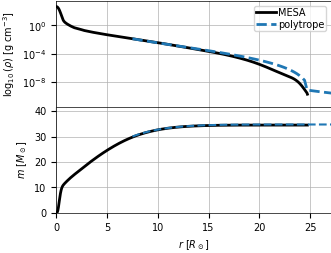

In [10]:


mesa_model = pg.read_model("../machoHBdata/machoHB/macho/macho.gyre")

p = ascii.read('../machoHBdata/hrd/hse_profile.dat',names=['r','rho','p','m'])


R1 = 1.71e12

plt.figure(figsize=(90*fig_mm,70*fig_mm))
plt.subplot(211)
#rstar = np.interp(-8.5,np.flip(np.log10(mesa_model['rho'])),np.flip(mesa_model['r']) )
rstar=mesa_model['r'][-1]
mstar = mesa_model['M_r'][-1]
print(mstar/c.msun,rstar/c.rsun)
plt.plot(mesa_model['r']/c.rsun,mesa_model['rho'],'k-',lw=2,label='MESA')
plt.plot(p['r']*R1/c.rsun,p['rho']*M1/R1**3,'--',lw=2,label='polytrope')
plt.semilogy()
plt.xlim(0,1.1*R1/c.rsun)
plt.ylim(3e-12,)
plt.xticks(visible=False)
plt.grid()
plt.ylabel(r"$\log_{10}\left(\rho \right)$ [g cm$^{-3}$]")
plt.legend()

plt.subplot(212)
plt.plot(mesa_model['r']/c.rsun,mesa_model['M_r']/c.msun,'k-',lw=2)
plt.plot(p['r']*R1/c.rsun,p['m']*M1/c.msun,'--')
plt.xlim(0.,1.1*R1/c.rsun)
plt.ylim(0,1.2*M1/c.msun)
plt.grid()
plt.ylabel(r"$m$ [$M_\odot$]")
plt.xlabel(r"$r$ [$R_\odot$]")
plt.subplots_adjust(hspace=0)
plt.savefig("figs/initial_model.pdf",bbox_inches='tight')

In [279]:
mesa_model['M_r'][-1] / c.msun

34.48976397134949

In [280]:
(4.18163e+27+ 4.26751e+26)/c.G

6.904976026370992e+34

In [281]:
6.0277e11/R1

0.3524970760233918

In [282]:
rstar/c.rsun

24.733825848161015

In [283]:
R1

1710000000000.0

In [284]:
1.71e12/c.rsun

24.586628324946084

In [285]:
p_in =  0.5115*(c.G*mstar**2 / rstar**4 )  
pa = 1.e-8*p_in
pa

183454.39459360918

In [286]:
0.35*np.sqrt(c.G*mstar/rstar)

18056327.85485173

# SURFACE MOVIES

In [56]:


def makesphere(x, y, z, radius, resolution=10):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)


# Observer vector
zf = 0.9
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)
camera = dict(
    eye=dict(x=n0[0]*zf, y=n0[1]*zf, z=n0[2]*zf)
)

for i in tqdm(range(len(mesh_fn_list))):
    print(i,mesh_fn_list[i])
    m = dd.io.load(mesh_fn_list[i])
    print((m['time']-tperi)/86400.)
    get_xir(m)

    x2,y2,z2 = ou.pos_secondary(orb,m['time'])   

    xs,ys,zs=makesphere(x2/c.rsun,y2/c.rsun,z2/c.rsun,4,resolution=100)

       
    r_centroids,th_centroids,ph_centroids = cart_to_polar( m['centroids'][:,0], m['centroids'][:,1],m['centroids'][:,2])
    xir_o_r = m['xir_faces']/req(th_centroids)
    ndn_all = np.dot(m["normals"],n0)
    ndn = np.where(ndn_all>0,ndn_all,0)
    Teff_centroids = Teff(xir_o_r,r_centroids,th_centroids,Tpole,tscale=tscale,xir_nl=xir_nl)
    flux_faces = BBlam(Teff_centroids,8e-5) 
    flux_faces_ld = h_ld(ndn)*flux_faces  


    fig = go.Figure(
        data=[go.Mesh3d(
            x=m["verts"][:,0]/c.rsun,
            y=m["verts"][:,1]/c.rsun,
            z=m["verts"][:,2]/c.rsun,
            i=m["faces"][:,0],
            j=m["faces"][:,1],
            k=m["faces"][:,2],
            intensity= flux_faces_ld ,
            intensitymode='cell',
            cmin=0,cmax=4.5e15,
            colorbar=dict(exponentformat='power',orientation='v',
                          len=0.5,
                          thickness=0.03,thicknessmode='fraction',
                          tickfont=dict(family='Helvetica'),
                          title=dict(text="Flux [erg s<sup>-1</sup> cm<sup>-2</sup>]",side='right')),
            lighting=dict(ambient=1),
            lightposition=dict(x=0,y=0,z=0)
         ),
        go.Surface(x=xs,y=ys,z=zs,
                  showscale=False,
                  surfacecolor=np.ones_like(zs),
                   colorscale='Greys',
                  lighting=dict(ambient=1)),
         ])


    myrange = np.array([-120,120])
    fig.update_layout(scene_camera=camera,
                     scene = dict(
                        xaxis = dict(range=myrange,showgrid=False,showbackground=True,title='',tickvals=[]),
                        yaxis = dict(range=myrange,showgrid=False,showbackground=True,title='',tickvals=[]),
                        zaxis = dict(range=myrange*0.35,showgrid=False,showbackground=True,title='',tickvals=[])),
                      scene_aspectmode='manual',
                      scene_aspectratio=dict(x=1,y=1,z=0.35),
                      width=1000,height=800,
                      margin=dict(r=0, l=0, b=0, t=0),
                      #paper_bgcolor='black',
                      #fig_bgcolor='black'
    )
    #fig.show(renderer='png')
    fig.write_image("figs/frames/flux_"+str(i+31)+".png")

  0%|          | 0/700 [00:00<?, ?it/s]

0 ../machoHBdata/hrd/mesh_00031_rho1e-9.5.h5
-63.20337962962963
1 ../machoHBdata/hrd/mesh_00032_rho1e-9.5.h5
-63.08770833333333
2 ../machoHBdata/hrd/mesh_00033_rho1e-9.5.h5
-62.97203703703704
3 ../machoHBdata/hrd/mesh_00034_rho1e-9.5.h5
-62.85634259259259
4 ../machoHBdata/hrd/mesh_00035_rho1e-9.5.h5
-62.740648148148146
5 ../machoHBdata/hrd/mesh_00036_rho1e-9.5.h5
-62.624976851851855
6 ../machoHBdata/hrd/mesh_00037_rho1e-9.5.h5
-62.508796296296296
7 ../machoHBdata/hrd/mesh_00038_rho1e-9.5.h5
-62.393125
8 ../machoHBdata/hrd/mesh_00039_rho1e-9.5.h5
-62.277453703703706
9 ../machoHBdata/hrd/mesh_00040_rho1e-9.5.h5
-62.16178240740741
10 ../machoHBdata/hrd/mesh_00041_rho1e-9.5.h5
-62.04611111111111
11 ../machoHBdata/hrd/mesh_00042_rho1e-9.5.h5
-61.93046296296296
12 ../machoHBdata/hrd/mesh_00043_rho1e-9.5.h5
-61.81481481481482
13 ../machoHBdata/hrd/mesh_00044_rho1e-9.5.h5
-61.69865740740741
14 ../machoHBdata/hrd/mesh_00045_rho1e-9.5.h5
-61.58298611111111
15 ../machoHBdata/hrd/mesh_00046_rho1e-

126 ../machoHBdata/hrd/mesh_00157_rho1e-9.5.h5
-48.62006944444445
127 ../machoHBdata/hrd/mesh_00158_rho1e-9.5.h5
-48.50439814814815
128 ../machoHBdata/hrd/mesh_00159_rho1e-9.5.h5
-48.388703703703705
129 ../machoHBdata/hrd/mesh_00160_rho1e-9.5.h5
-48.273032407407406
130 ../machoHBdata/hrd/mesh_00161_rho1e-9.5.h5
-48.15733796296296
131 ../machoHBdata/hrd/mesh_00162_rho1e-9.5.h5
-48.041666666666664
132 ../machoHBdata/hrd/mesh_00163_rho1e-9.5.h5
-47.92548611111111
133 ../machoHBdata/hrd/mesh_00164_rho1e-9.5.h5
-47.809814814814814
134 ../machoHBdata/hrd/mesh_00165_rho1e-9.5.h5
-47.69412037037037
135 ../machoHBdata/hrd/mesh_00166_rho1e-9.5.h5
-47.57844907407407
136 ../machoHBdata/hrd/mesh_00167_rho1e-9.5.h5
-47.46277777777778
137 ../machoHBdata/hrd/mesh_00168_rho1e-9.5.h5
-47.34708333333333
138 ../machoHBdata/hrd/mesh_00169_rho1e-9.5.h5
-47.23141203703704
139 ../machoHBdata/hrd/mesh_00170_rho1e-9.5.h5
-47.115717592592596
140 ../machoHBdata/hrd/mesh_00171_rho1e-9.5.h5
-46.99953703703704
141 .

250 ../machoHBdata/hrd/mesh_00281_rho1e-9.5.h5
-34.26849537037037
251 ../machoHBdata/hrd/mesh_00282_rho1e-9.5.h5
-34.15229166666666
252 ../machoHBdata/hrd/mesh_00283_rho1e-9.5.h5
-34.036574074074075
253 ../machoHBdata/hrd/mesh_00284_rho1e-9.5.h5
-33.92085648148148
254 ../machoHBdata/hrd/mesh_00285_rho1e-9.5.h5
-33.80511574074074
255 ../machoHBdata/hrd/mesh_00286_rho1e-9.5.h5
-33.689375
256 ../machoHBdata/hrd/mesh_00287_rho1e-9.5.h5
-33.57361111111111
257 ../machoHBdata/hrd/mesh_00288_rho1e-9.5.h5
-33.457824074074075
258 ../machoHBdata/hrd/mesh_00289_rho1e-9.5.h5
-33.3425462962963
259 ../machoHBdata/hrd/mesh_00290_rho1e-9.5.h5
-33.22675925925926
260 ../machoHBdata/hrd/mesh_00291_rho1e-9.5.h5
-33.11097222222222
261 ../machoHBdata/hrd/mesh_00292_rho1e-9.5.h5
-32.99513888888889
262 ../machoHBdata/hrd/mesh_00293_rho1e-9.5.h5
-32.87935185185185
263 ../machoHBdata/hrd/mesh_00294_rho1e-9.5.h5
-32.76351851851852
264 ../machoHBdata/hrd/mesh_00295_rho1e-9.5.h5
-32.64773148148148
265 ../machoHBdat

374 ../machoHBdata/hrd/mesh_00405_rho1e-9.5.h5
-19.91662037037037
375 ../machoHBdata/hrd/mesh_00406_rho1e-9.5.h5
-19.800462962962964
376 ../machoHBdata/hrd/mesh_00407_rho1e-9.5.h5
-19.684768518518517
377 ../machoHBdata/hrd/mesh_00408_rho1e-9.5.h5
-19.56912037037037
378 ../machoHBdata/hrd/mesh_00409_rho1e-9.5.h5
-19.453425925925927
379 ../machoHBdata/hrd/mesh_00410_rho1e-9.5.h5
-19.33773148148148
380 ../machoHBdata/hrd/mesh_00411_rho1e-9.5.h5
-19.222083333333334
381 ../machoHBdata/hrd/mesh_00412_rho1e-9.5.h5
-19.10638888888889
382 ../machoHBdata/hrd/mesh_00413_rho1e-9.5.h5
-18.990694444444443
383 ../machoHBdata/hrd/mesh_00414_rho1e-9.5.h5
-18.874537037037037
384 ../machoHBdata/hrd/mesh_00415_rho1e-9.5.h5
-18.758842592592593
385 ../machoHBdata/hrd/mesh_00416_rho1e-9.5.h5
-18.64314814814815
386 ../machoHBdata/hrd/mesh_00417_rho1e-9.5.h5
-18.5275
387 ../machoHBdata/hrd/mesh_00418_rho1e-9.5.h5
-18.411805555555556
388 ../machoHBdata/hrd/mesh_00419_rho1e-9.5.h5
-18.296157407407406
389 ../mach

498 ../machoHBdata/hrd/mesh_00529_rho1e-9.5.h5
-5.564490740740741
499 ../machoHBdata/hrd/mesh_00530_rho1e-9.5.h5
-5.448796296296297
500 ../machoHBdata/hrd/mesh_00531_rho1e-9.5.h5
-5.333333333333333
501 ../machoHBdata/hrd/mesh_00532_rho1e-9.5.h5
-5.217407407407407
502 ../machoHBdata/hrd/mesh_00533_rho1e-9.5.h5
-5.101712962962963
503 ../machoHBdata/hrd/mesh_00534_rho1e-9.5.h5
-4.986018518518518
504 ../machoHBdata/hrd/mesh_00535_rho1e-9.5.h5
-4.870324074074074
505 ../machoHBdata/hrd/mesh_00536_rho1e-9.5.h5
-4.754166666666666
506 ../machoHBdata/hrd/mesh_00537_rho1e-9.5.h5
-4.638472222222222
507 ../machoHBdata/hrd/mesh_00538_rho1e-9.5.h5
-4.522777777777778
508 ../machoHBdata/hrd/mesh_00539_rho1e-9.5.h5
-4.40712962962963
509 ../machoHBdata/hrd/mesh_00540_rho1e-9.5.h5
-4.291435185185185
510 ../machoHBdata/hrd/mesh_00541_rho1e-9.5.h5
-4.175787037037037
511 ../machoHBdata/hrd/mesh_00542_rho1e-9.5.h5
-4.060092592592593
512 ../machoHBdata/hrd/mesh_00543_rho1e-9.5.h5
-3.9444444444444446
513 ../mac

624 ../machoHBdata/hrd/mesh_00655_rho1e-9.5.h5
9.018842592592593
625 ../machoHBdata/hrd/mesh_00656_rho1e-9.5.h5
9.134490740740741
626 ../machoHBdata/hrd/mesh_00657_rho1e-9.5.h5
9.25013888888889
627 ../machoHBdata/hrd/mesh_00658_rho1e-9.5.h5
9.365787037037038
628 ../machoHBdata/hrd/mesh_00659_rho1e-9.5.h5
9.481944444444444
629 ../machoHBdata/hrd/mesh_00660_rho1e-9.5.h5
9.597546296296295
630 ../machoHBdata/hrd/mesh_00661_rho1e-9.5.h5
9.713194444444444
631 ../machoHBdata/hrd/mesh_00662_rho1e-9.5.h5
9.828842592592592
632 ../machoHBdata/hrd/mesh_00663_rho1e-9.5.h5
9.94449074074074
633 ../machoHBdata/hrd/mesh_00664_rho1e-9.5.h5
10.060694444444444
634 ../machoHBdata/hrd/mesh_00665_rho1e-9.5.h5
10.176342592592592
635 ../machoHBdata/hrd/mesh_00666_rho1e-9.5.h5
10.292037037037037
636 ../machoHBdata/hrd/mesh_00667_rho1e-9.5.h5
10.407685185185185
637 ../machoHBdata/hrd/mesh_00668_rho1e-9.5.h5
10.52337962962963
638 ../machoHBdata/hrd/mesh_00669_rho1e-9.5.h5
10.639074074074074
639 ../machoHBdata/hrd

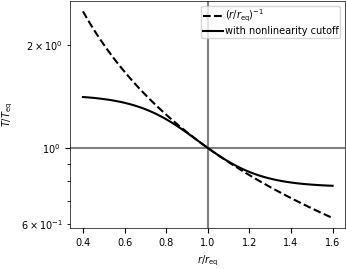

In [57]:
def tf(xir_o_r,tscale,xir_nl):
    return (1+xir_nl*np.tanh(xir_o_r/xir_nl))**tscale

plt.figure(figsize=(90*fig_mm,75*fig_mm))
xp = 1+np.linspace(-0.6,0.6,101)
plt.axvline(1,color='grey')
plt.axhline(1,color='grey')
a=-1.
plt.plot(xp,(xp/1)**a,'k--' ,label=r'$(r/r_{\rm eq})^{-1}$')
plt.plot(xp,tf((xp-1)/1,a,0.3),'k' ,label='with nonlinearity cutoff')
#a=1.6
#plt.plot(xp,(xp/1)**a,'b--' )
#plt.plot(xp,tf((xp-1)/1,a,0.2),'b' )
plt.xlabel(r'$r/r_{\rm eq}$')
plt.ylabel(r'$T/T_{\rm eq}$')
plt.legend()
plt.semilogy()
plt.savefig("figs/temp.pdf",bbox_inches='tight')

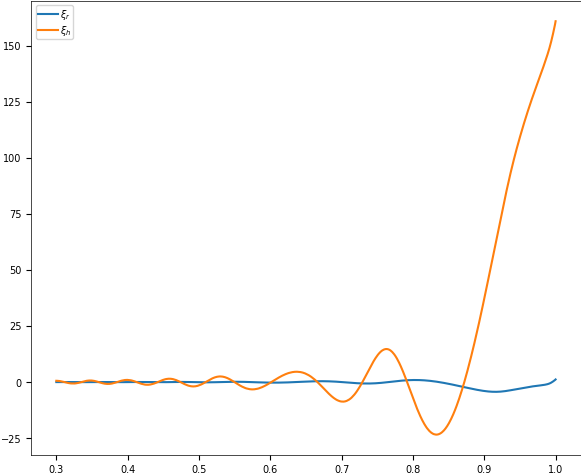

In [58]:


g = pg.read_output("../machoHBdata/machoHB/gyre/mode_nad.001_+00_-00015.txt")

plt.plot(g['x'],g['xi_r'],label=r'$\xi_r$')
plt.plot(g['x'],g['xi_h'],label=r'$\xi_h$')
plt.legend()

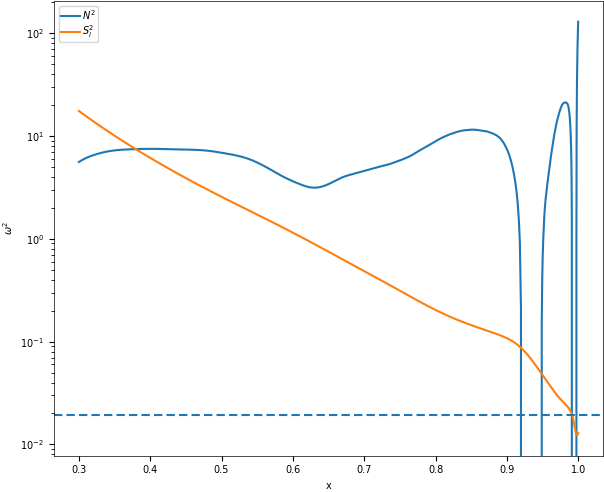

In [59]:

l = 1 #g.meta['l']
omega = 0.1388428655691007E+000 #g.meta['omega']

x = g['x']
V = g['V_2']*g['x']**2
As = g['As']
c_1 = g['c_1']
Gamma_1 = g['Gamma_1']

g['N2'] = g['As']/g['c_1']
g['Sl2'] = l*(l+1)*Gamma_1/(V*c_1)

# Plot the propagation diagram

plt.figure()

plt.plot(g['x'], g['N2'], label='$N^2$')
plt.plot(g['x'], g['Sl2'], label='$S_l^2$')

plt.axhline(omega.real**2, dashes=(4,2))

plt.legend()

plt.xlabel('x')
plt.ylabel('$\omega^2$')

#plt.ylim(5e-2, 5e2)
plt.yscale('log')

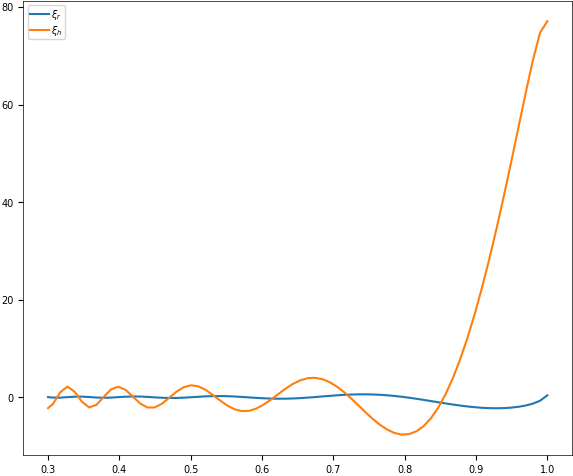

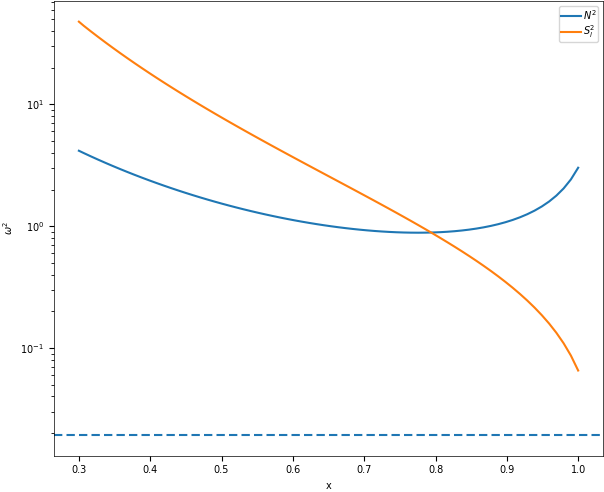

In [60]:


g = pg.read_output("../machoHBdata/machoHB/gyre_poly/mode.001_+00_-00010.txt")

plt.plot(g['x'],g['xi_r'],label=r'$\xi_r$')
plt.plot(g['x'],g['xi_h'],label=r'$\xi_h$')
plt.legend()

l = 2 #g.meta['l']
omega = 0.1388428655691007E+000 #g.meta['omega']

x = g['x']
V = g['V_2']*g['x']**2
As = g['As']
c_1 = g['c_1']
Gamma_1 = g['Gamma_1']

g['N2'] = g['As']/g['c_1']
g['Sl2'] = l*(l+1)*Gamma_1/(V*c_1)

# Plot the propagation diagram

plt.figure()

plt.plot(g['x'], g['N2'], label='$N^2$')
plt.plot(g['x'], g['Sl2'], label='$S_l^2$')

plt.axhline(omega.real**2, dashes=(4,2))

plt.legend()

plt.xlabel('x')
plt.ylabel('$\omega^2$')

#plt.ylim(5e-2, 5e2)
plt.yscale('log')

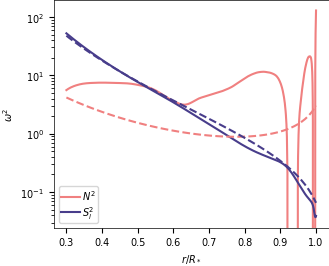

In [61]:
g = pg.read_output("../machoHBdata/machoHB/gyre/mode.001_+00_-00015.txt")

l = 2 #g.meta['l']

x = g['x']
V = g['V_2']*g['x']**2
As = g['As']
c_1 = g['c_1']
Gamma_1 = g['Gamma_1']

g['N2'] = g['As']/g['c_1']
g['Sl2'] = l*(l+1)*Gamma_1/(V*c_1)

# Plot the propagation diagram

plt.figure(figsize=(90*fig_mm,75*fig_mm))

plt.plot(g['x'], g['N2'], label='$N^2$',ls='-',color='LightCoral')
plt.plot(g['x'], g['Sl2'], label='$S_l^2$',ls='-',color='DarkSlateBlue')

#om2nad = 0.29999056E+01
#om2mod = 0.25326170E+01
#om16mod = 0.41408912E-01
#om16nad = 0.84695324E-01
#plt.axhline(om2nad**2,label='$\omega_2$')
#plt.axhline(om2mod**2,ls='--')

plt.legend()



g = pg.read_output("../machoHBdata/machoHB/gyre_poly/mode.001_+00_-00015.txt")

l = 2 #g.meta['l']

x = g['x']
V = g['V_2']*g['x']**2
As = g['As']
c_1 = g['c_1']
Gamma_1 = g['Gamma_1']

g['N2'] = g['As']/g['c_1']
g['Sl2'] = l*(l+1)*Gamma_1/(V*c_1)

# Plot the propagation diagram
plt.plot(g['x'], g['N2'], label='$N^2$',ls='--',color='LightCoral')
plt.plot(g['x'], g['Sl2'], label='$S_l^2$',ls='--',color='DarkSlateBlue')


plt.xlabel(r'$r/R_*$')
plt.ylabel('$\omega^2$')

#plt.ylim(5e-2, 5e2)
plt.yscale('log')
#plt.title()

plt.savefig("figs/prop_diagram.pdf",bbox_inches='tight')


# LC variations

prot [d] = 4.418080823714948
reading orbit file for binary simulation...
tperi =  36460800.0
len(mesh_fn_list) = 700
33000006.0
1.8334038692929877 2.2895284291802027 1.2487856426653607
26.360947078260068 32.91917223839256
Tpole =  32451.20973070544
Tequator = 21390.681827401768
L/Leq =  1.0019634508382664


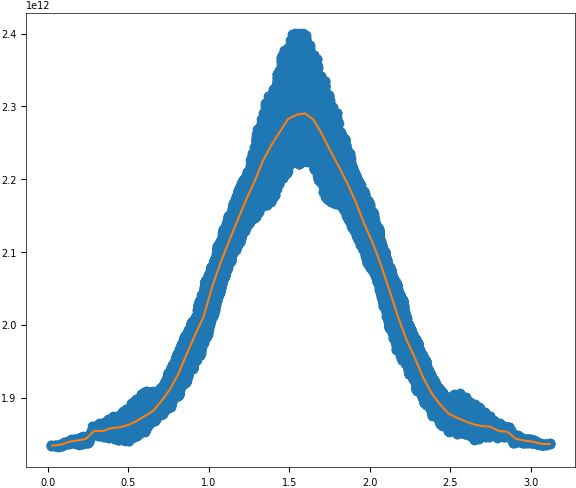

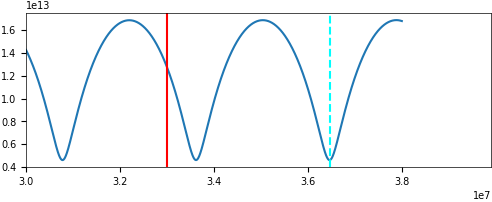

In [62]:
base_dir = "../machoHBdata/hrd/"

M1 = 6.905e+34
Omega_env=1.64601e-05 
print("prot [d] =",2*np.pi/Omega_env / 86400.)

orb = ou.read_trackfile(base_dir+"pm_trackfile.dat")
sel = (orb['time']>33879604.0) & (orb['time']<36990004.0)
tperi = orb[sel]['time'][ np.argmin(orb[sel]['sep']) ]
print('tperi = ',tperi)


mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-9.5.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)

Leq = 4e5*3.846e33

Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()

In [63]:
### PARAMS
tscale = -1.0
xir_nl = 0.3
lam = 8e-5 # 800nm

# Observer vector
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)



#pm = ascii.read("/Users/morganmacleod/Dropbox/CE_princeton/Cooling/Analysis/phoebe_macho_model.dat")

phase = np.array([0.533, 0.806, 0.385, 0.595, 0.627, 0.297, 0.905, 0.270, 0.331, 0.361, 0.756, 0.030, 0.123, 0.871, 0.901, 0.755, 0.998])
RV = np.array([271.0,251.3, 294.7, 254.2, 256.2, 301.2, 245.3, 315.2, 306.8, 294.7, 247.8, 350.9, 360.9, 237.0, 252.8, 251.3, 313.8])
sRV = np.array([5.8, 5.2, 6.2, 9.8, 12.8, 4.9, 4.0, 6.5, 4.5, 4.8, 4.4, 6.9, 7.3, 6.0, 5.3, 6.4, 5.5])
Porb = 32.836 # d
Tyr1 = ascii.read("yr1.csv",names=['phase','flux'])
Tyr3 = ascii.read("yr3.csv",names=['phase','flux'])

#sel1orb = orb['time']<Porb*86400
#tperi = orb['time'][sel1orb][np.argmin(orb['sep'][sel1orb])]

skip = 1

paraml = [-2,-1,0]

jtl = []
for p in paraml:
    print(p)
    Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=p,lam=lam,xir_nl=xir_nl)
    jtl.append(Jt)

-2


  0%|          | 0/699 [00:00<?, ?it/s]

-1


  0%|          | 0/699 [00:00<?, ?it/s]

0


  0%|          | 0/699 [00:00<?, ?it/s]

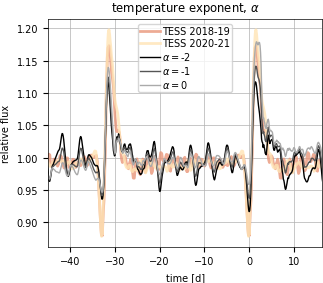

In [64]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
plt.plot(Tyr1['phase']*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='TESS 2018-19',alpha=0.8)
plt.plot((Tyr1['phase']-1)*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='',alpha=0.8)
plt.plot(Tyr3['phase']*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='TESS 2020-21',alpha=0.8)
plt.plot((Tyr3['phase']-1)*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='',alpha=0.8)


for i,p in enumerate(paraml):
    plt.plot((jtl[i]['time']-tperi)/86400,
             jtl[i]['flux']/np.mean(jtl[i]['flux']),
             '-',label=r'$\alpha=$'+str(p),lw=1,
             color=plt.cm.gray(i/len(paraml)))



plt.xlim(-45,Tyr3['phase'][-1]*Porb)
plt.ylabel('relative flux')
plt.grid()
plt.legend()
plt.xlabel('time [d]')
plt.title(r"temperature exponent, $\alpha$")
plt.savefig("figs/lc_var_alpha.pdf",bbox_inches='tight')

In [65]:
### PARAMS
tscale = -1.0
xir_nl = 0.3
lam = 8e-5 # 800nm

# Observer vector
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)



#pm = ascii.read("/Users/morganmacleod/Dropbox/CE_princeton/Cooling/Analysis/phoebe_macho_model.dat")

phase = np.array([0.533, 0.806, 0.385, 0.595, 0.627, 0.297, 0.905, 0.270, 0.331, 0.361, 0.756, 0.030, 0.123, 0.871, 0.901, 0.755, 0.998])
RV = np.array([271.0,251.3, 294.7, 254.2, 256.2, 301.2, 245.3, 315.2, 306.8, 294.7, 247.8, 350.9, 360.9, 237.0, 252.8, 251.3, 313.8])
sRV = np.array([5.8, 5.2, 6.2, 9.8, 12.8, 4.9, 4.0, 6.5, 4.5, 4.8, 4.4, 6.9, 7.3, 6.0, 5.3, 6.4, 5.5])
Porb = 32.836 # d
Tyr1 = ascii.read("yr1.csv",names=['phase','flux'])
Tyr3 = ascii.read("yr3.csv",names=['phase','flux'])

#sel1orb = orb['time']<Porb*86400
#tperi = orb['time'][sel1orb][np.argmin(orb['sep'][sel1orb])]

skip = 1

paraml = [0.1,10**-0.5,1.0]

jtl = []
for p in paraml:
    print(p)
    Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=tscale,lam=lam,xir_nl=p)
    jtl.append(Jt)

0.1


  0%|          | 0/699 [00:00<?, ?it/s]

0.31622776601683794


  0%|          | 0/699 [00:00<?, ?it/s]

1.0


  0%|          | 0/699 [00:00<?, ?it/s]

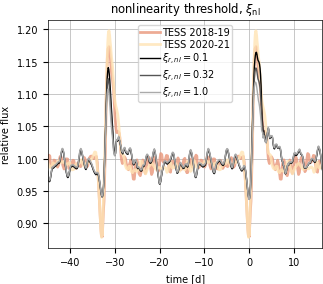

In [66]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
plt.plot(Tyr1['phase']*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='TESS 2018-19',alpha=0.8)
plt.plot((Tyr1['phase']-1)*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='',alpha=0.8)
plt.plot(Tyr3['phase']*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='TESS 2020-21',alpha=0.8)
plt.plot((Tyr3['phase']-1)*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='',alpha=0.8)



for i,p in enumerate(paraml):
    plt.plot((jtl[i]['time']-tperi)/86400,
             jtl[i]['flux']/np.mean(jtl[i]['flux']),
             '-',label=r'$\xi_{r,nl}=$'+str(np.round(p,2)),lw=1,
             color=plt.cm.gray(i/len(paraml)))



plt.xlim(-45,Tyr3['phase'][-1]*Porb)
plt.ylabel('relative flux')
plt.grid()
plt.legend()
plt.xlabel('time [d]')
plt.title(r"nonlinearity threshold, $\xi_{\rm nl}$")
plt.savefig("figs/lc_var_xirnl.pdf",bbox_inches='tight')

In [67]:
### PARAMS
tscale = -1.0
xir_nl = 0.3
lam = 8e-5 # 800nm

# Observer vector
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)



#pm = ascii.read("/Users/morganmacleod/Dropbox/CE_princeton/Cooling/Analysis/phoebe_macho_model.dat")

phase = np.array([0.533, 0.806, 0.385, 0.595, 0.627, 0.297, 0.905, 0.270, 0.331, 0.361, 0.756, 0.030, 0.123, 0.871, 0.901, 0.755, 0.998])
RV = np.array([271.0,251.3, 294.7, 254.2, 256.2, 301.2, 245.3, 315.2, 306.8, 294.7, 247.8, 350.9, 360.9, 237.0, 252.8, 251.3, 313.8])
sRV = np.array([5.8, 5.2, 6.2, 9.8, 12.8, 4.9, 4.0, 6.5, 4.5, 4.8, 4.4, 6.9, 7.3, 6.0, 5.3, 6.4, 5.5])
Porb = 32.836 # d
Tyr1 = ascii.read("yr1.csv",names=['phase','flux'])
Tyr3 = ascii.read("yr3.csv",names=['phase','flux'])

#sel1orb = orb['time']<Porb*86400
#tperi = orb['time'][sel1orb][np.argmin(orb['sep'][sel1orb])]

skip = 1

paraml = [2e-5,4e-5,8e-5]

jtl = []
for p in paraml:
    print(p)
    Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=tscale,lam=p,xir_nl=xir_nl)
    jtl.append(Jt)

2e-05


  0%|          | 0/699 [00:00<?, ?it/s]

4e-05


  0%|          | 0/699 [00:00<?, ?it/s]

8e-05


  0%|          | 0/699 [00:00<?, ?it/s]

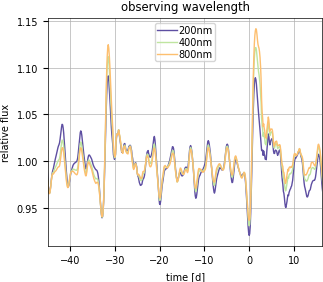

In [68]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))

for i,p in enumerate(paraml):
    plt.plot((jtl[i]['time']-tperi)/86400,
             jtl[i]['flux']/np.mean(jtl[i]['flux']),
             '-',label=str(int(p*1e7))+"nm",lw=1,
             color=plt.cm.Spectral_r(i/(len(paraml)) ))



plt.xlim(-45,Tyr3['phase'][-1]*Porb)
plt.ylabel('relative flux')
plt.grid()
plt.legend()
plt.xlabel('time [d]')
plt.title("observing wavelength")
plt.savefig("figs/lc_var_lam.pdf",bbox_inches='tight')

len(mesh_fn_list) = 700
33000006.0
1.7061092921917211 2.094954000686493 1.2279131297592605
24.530687163072916 30.121552849554178
Tpole =  32386.238311724654
Tequator = 24062.207540552354
L/Leq =  0.9999826272149771


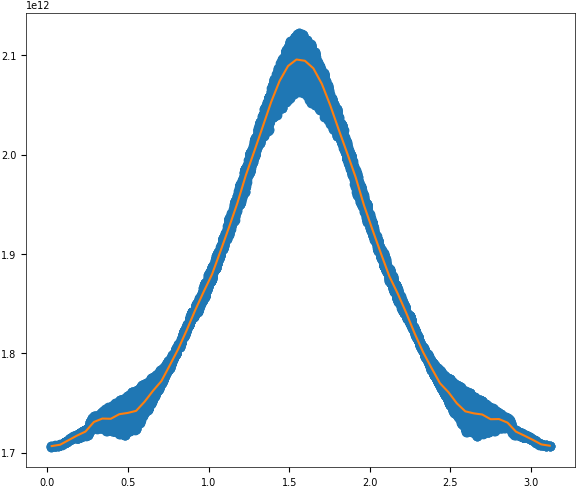

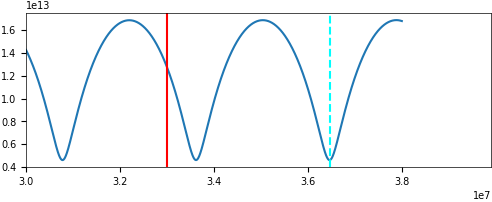

  0%|          | 0/699 [00:00<?, ?it/s]

len(mesh_fn_list) = 700
33000006.0
1.7943846019068126 2.213801120477759 1.2337383625145084
25.799922385432243 31.830353996804583
Tpole =  32197.00436349117
Tequator = 22486.436513097513
L/Leq =  1.0027272984918556


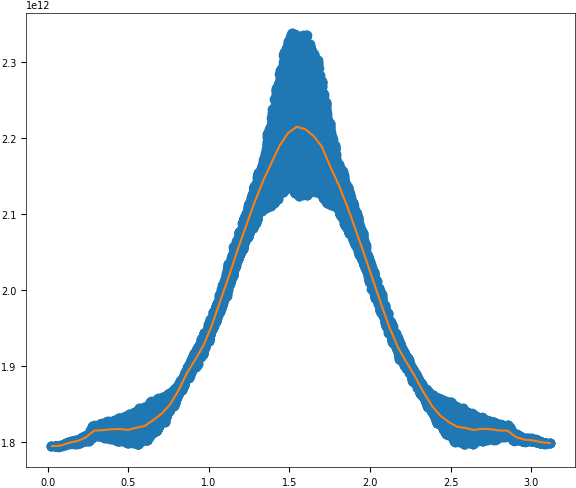

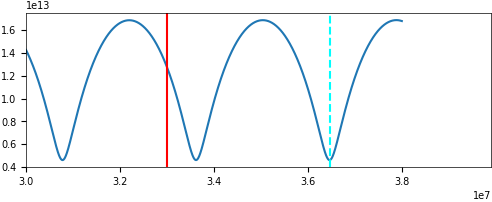

  0%|          | 0/699 [00:00<?, ?it/s]

len(mesh_fn_list) = 700
33000006.0
1.8334038692929877 2.2895284291802027 1.2487856426653607
26.360947078260068 32.91917223839256
Tpole =  32451.20973070544
Tequator = 21390.681827401768
L/Leq =  1.0019634508382664


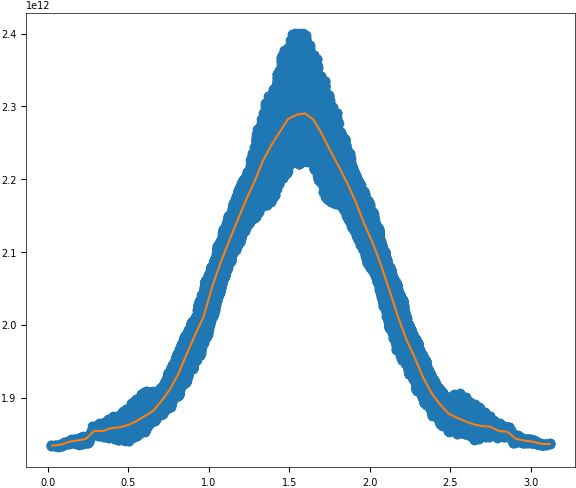

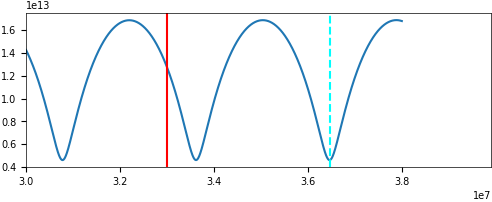

  0%|          | 0/699 [00:00<?, ?it/s]

len(mesh_fn_list) = 700
33000006.0
1.8839523801590723 2.391793737604875 1.2695616740604256
27.087740908110312 34.3895576938156
Tpole =  32922.13439241476
Tequator = 19430.712681539273
L/Leq =  1.0016752802952391


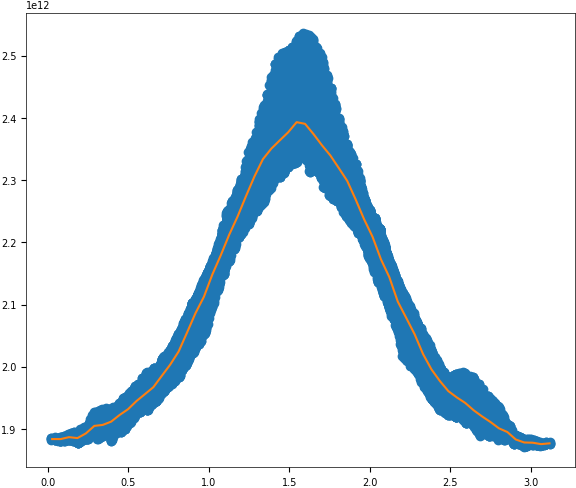

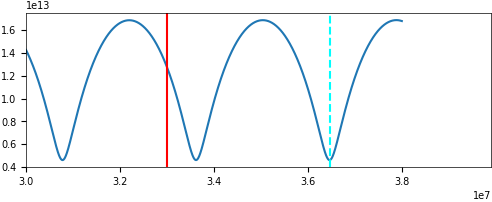

  0%|          | 0/699 [00:00<?, ?it/s]

In [ ]:
mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-8.0.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)

Leq = 4e5*3.846e33

Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()


### PARAMS
tscale = -1.0
xir_nl = 0.3
lam = 8e-5 # 800nm

# Observer vector
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)



phase = np.array([0.533, 0.806, 0.385, 0.595, 0.627, 0.297, 0.905, 0.270, 0.331, 0.361, 0.756, 0.030, 0.123, 0.871, 0.901, 0.755, 0.998])
RV = np.array([271.0,251.3, 294.7, 254.2, 256.2, 301.2, 245.3, 315.2, 306.8, 294.7, 247.8, 350.9, 360.9, 237.0, 252.8, 251.3, 313.8])
sRV = np.array([5.8, 5.2, 6.2, 9.8, 12.8, 4.9, 4.0, 6.5, 4.5, 4.8, 4.4, 6.9, 7.3, 6.0, 5.3, 6.4, 5.5])
Porb = 32.836 # d
Tyr1 = ascii.read("yr1.csv",names=['phase','flux'])
Tyr3 = ascii.read("yr3.csv",names=['phase','flux'])

skip = 1

jtl = []

Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=tscale,lam=lam,xir_nl=xir_nl)
jtl.append(Jt)


#######################################################################################
mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-9.0.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)


Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()

Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=tscale,lam=lam,xir_nl=xir_nl)
jtl.append(Jt)

mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-9.5.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)

Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()

Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=tscale,lam=lam,xir_nl=xir_nl)
jtl.append(Jt)


mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-10.0.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)

Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()

Jt = get_lc_xi(mesh_fn_list[1::skip],n0,Tpole,tscale=tscale,lam=lam,xir_nl=xir_nl)
jtl.append(Jt)

reading orbit file for binary simulation...
tperi =  36460800.0
len(mesh_fn_list) = 700
33000006.0
1.8334038692929877 2.2895284291802027 1.2487856426653607
26.360947078260068 32.91917223839256
Tpole =  32451.20973070544
Tequator = 21390.681827401768
L/Leq =  1.0019634508382664


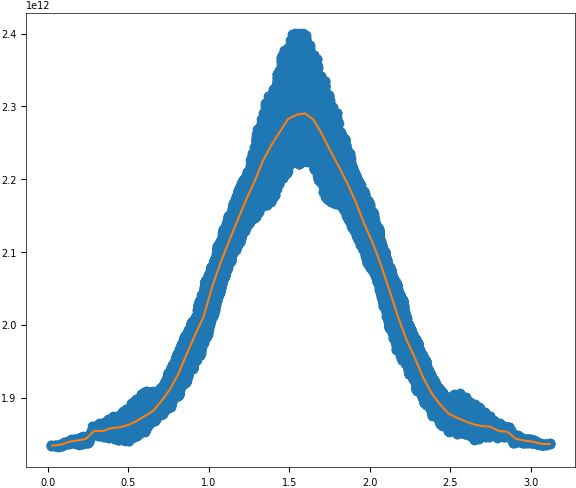

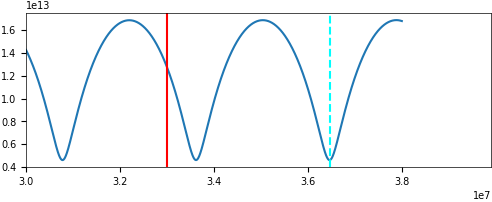

In [70]:
base_dir = "../machoHBdata/hrd/"

M1 = 6.905e+34
Omega_env=1.64601e-05 
print("prot [d] =",2*np.pi/Omega_env / 86400.)

orb = ou.read_trackfile(base_dir+"pm_trackfile.dat")
sel = (orb['time']>33879604.0) & (orb['time']<36990004.0)
tperi = orb[sel]['time'][ np.argmin(orb[sel]['sep']) ]
print('tperi = ',tperi)


mesh_fn_list = sorted(glob(base_dir+"mesh_[0][0-9][0-9][0-9][0-9]_rho1e-9.5.h5"))

print("len(mesh_fn_list) =", len(mesh_fn_list))

meq = dd.io.load(mesh_fn_list[200])
print(meq['time'])
req = get_req_func_mesh(meq)
get_xir(meq)
print(req(0)/1.e12,req(np.pi/2)/1.e12, req(np.pi/2)/req(0.0))
print(req(0)/c.rsun,req(np.pi/2)/c.rsun)

Leq = 4e5*3.846e33

Tpole = get_Tpole(meq,Leq)
print("Tpole = ",Tpole)
print("Tequator =",Teff(0,req(np.pi/2),np.pi/2,Tpole))
print("L/Leq = ",Luminosity(meq,Tpole,tscale=-1)/Leq)

plt.figure(figsize=(6,2))
plt.plot(orb['time'],orb['sep'])
plt.axvline(tperi,color='cyan',ls='--')
plt.axvline(meq['time'],color='r')
plt.xlim(3e7,)
plt.show()

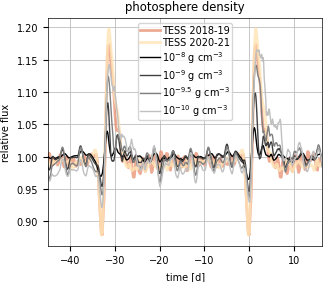

In [71]:
plt.figure(figsize=(90*fig_mm,75*fig_mm))
plt.plot(Tyr1['phase']*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='TESS 2018-19',alpha=0.8)
plt.plot((Tyr1['phase']-1)*Porb, 1+Tyr1['flux'],lw=2,color='DarkSalmon',label='',alpha=0.8)
plt.plot(Tyr3['phase']*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='TESS 2020-21',alpha=0.8)
plt.plot((Tyr3['phase']-1)*Porb, 1+Tyr3['flux'],lw=2,color='Moccasin',label='',alpha=0.8)



ll = [r"$10^{-8}$ g cm$^{-3}$",
      r"$10^{-9}$ g cm$^{-3}$",
      r"$10^{-9.5}$ g cm$^{-3}$",
      r"$10^{-10}$ g cm$^{-3}$"]

for i,jt in enumerate(jtl):
    plt.plot((jt['time']-tperi)/86400,
             jt['flux']/np.mean(jt['flux']),
             '-',label=ll[i],lw=1,
             color=plt.cm.gray(i/len(jtl) ),alpha=1)



plt.xlim(-45,Tyr3['phase'][-1]*Porb)
plt.ylabel('relative flux')
plt.grid()
plt.legend()
plt.xlabel('time [d]')

plt.title("photosphere density")
plt.savefig("figs/lc_var_rhos.pdf",bbox_inches='tight')


In [72]:
0.5 * 3e6**2  * c.mp * 0.61 / c.kB

33254.775009452016

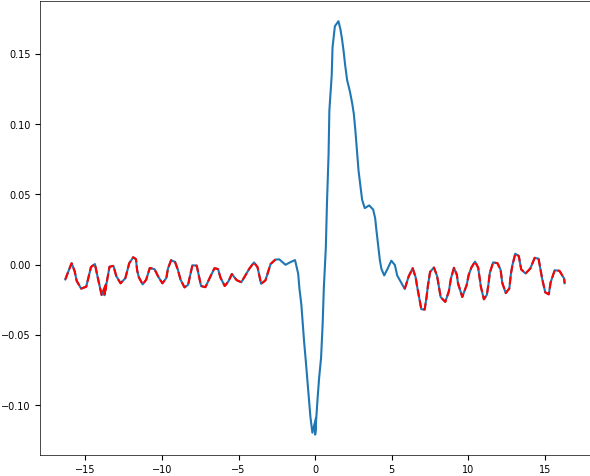

In [77]:
plt.plot(Tyr1['phase']*Porb, Tyr1['flux'] )
sel1 = Tyr1['phase']*Porb > 5.5
plt.plot(Tyr1['phase'][sel1]*Porb, Tyr1['flux'][sel1],'r--' )
sel2 = Tyr1['phase']*Porb < -2.5
plt.plot(Tyr1['phase'][sel2]*Porb, Tyr1['flux'][sel2],'r--' )

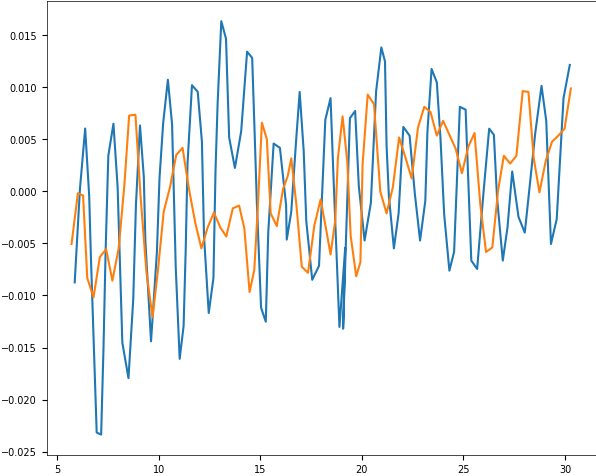

In [78]:


t1 = Tyr1[sel1]
t2 = Tyr1[sel2]
t2['phase'] += 1

TEOyr1 = vstack( [t1,t2] )

plt.plot(TEOyr1['phase']*Porb,TEOyr1['flux'] - np.mean(TEOyr1['flux']))

sel1 = Tyr3['phase']*Porb > 5.5
sel2 = Tyr3['phase']*Porb < -2.5
t1 = Tyr3[sel1]
t2 = Tyr3[sel2]
t2['phase'] += 1

TEOyr3 = vstack( [t1,t2] )

plt.plot(TEOyr3['phase']*Porb,TEOyr3['flux'] - np.mean(TEOyr3['flux']))



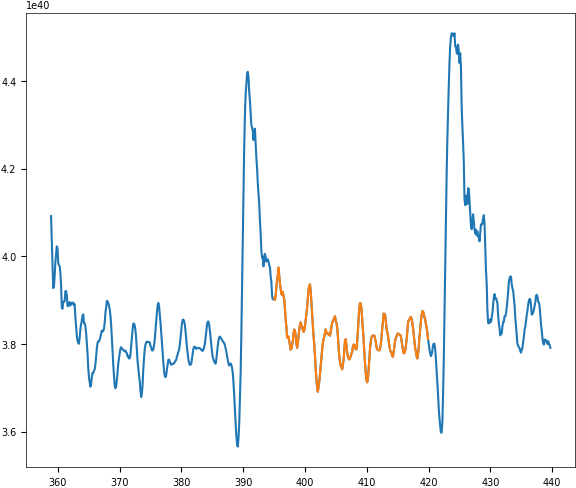

In [79]:
#sel=Jt['time']/86400.<385
sel = (Jt['time']/86400.>395) & (Jt['time']/86400.<420)
plt.plot(Jt['time']/86400.,Jt['flux'])
plt.plot(Jt['time'][sel]/86400.,Jt[sel]['flux'])

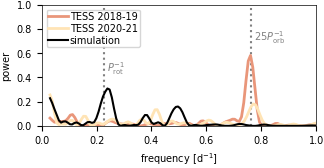

In [80]:

frequency, power = LombScargle(TEOyr1['phase']*Porb, TEOyr1['flux'],nterms=1 ).autopower(minimum_frequency=1/Porb,
                                                                                          maximum_frequency=1.2)

plt.figure(figsize=(90*fig_mm,40*fig_mm))
plt.plot(frequency, power,lw=2,color='DarkSalmon',label='TESS 2018-19')  
plt.xlim(0,1)

frequency, power = LombScargle(TEOyr3['phase']*Porb, TEOyr3['flux'],nterms=1 ).autopower(minimum_frequency=1/Porb,
                                                                                          maximum_frequency=1.2)

plt.plot(frequency, power,lw=2,color='Moccasin',label='TESS 2020-21')  

frequency, power = LombScargle(Jt['time'][sel]/86400.,Jt[sel]['flux'],nterms=1 ).autopower(minimum_frequency=1/Porb,
                                                                                          maximum_frequency=1.2)
plt.plot(frequency, power,color='k',label='simulation')  
plt.xlim(0,1)
plt.axvline(1/4.418,color='grey',zorder=0,ls=':')
plt.axvline(25/Porb,color='grey',zorder=0,ls=':')
plt.annotate(r' $P_{\rm rot}^{-1}$',(1/4.418,0.45),color='grey',fontsize=7)
plt.annotate(r' $25P_{\rm orb}^{-1}$',(25/Porb,0.7),color='grey',fontsize=7)


plt.ylabel('power')
plt.xlabel(r'frequency [d$^{-1}$]')
plt.legend(loc='upper left')
plt.ylim(0,1)
plt.savefig("figs/periodogram.pdf",bbox_inches='tight')

In [319]:
dl = []

def readfile(base_dir):
    orb = ou.read_trackfile(base_dir+"pm_trackfile.dat")
    fn = base_dir+"HSE.out1.00010.athdf"
    return ou.read_data(fn,orb,level=None)

dl.append( readfile("../machoHBdata/2dhse/lr/") )
dl.append( readfile("../machoHBdata/2dhse/mr/") )
dl.append( readfile("../machoHBdata/2dhse/hr/") )


reading orbit file for binary simulation...
read_data...reading file ../machoHBdata/2dhse/lr/HSE.out1.00010.athdf
 ...file read, constructing arrays
 ...gamma= 1.6666666666666667
...getting cartesian arrays...
reading orbit file for binary simulation...
read_data...reading file ../machoHBdata/2dhse/mr/HSE.out1.00010.athdf
 ...file read, constructing arrays
 ...gamma= 1.6666666666666667
...getting cartesian arrays...
reading orbit file for binary simulation...
read_data...reading file ../machoHBdata/2dhse/hr/HSE.out1.00010.athdf


/Users/morganmacleod/Dropbox/CE_princeton/MACHO_HB/Analysis/HBStarWaveBreaking/merger_analysis/OrbitAnalysisUtils.py:47: RuntimeWarning:

invalid value encountered in divide

/Users/morganmacleod/Dropbox/CE_princeton/MACHO_HB/Analysis/HBStarWaveBreaking/merger_analysis/OrbitAnalysisUtils.py:48: RuntimeWarning:

invalid value encountered in divide

/Users/morganmacleod/Dropbox/CE_princeton/MACHO_HB/Analysis/HBStarWaveBreaking/merger_analysis/OrbitAnalysisUtils.py:49: RuntimeWarning:

invalid value encountered in divide



 ...file read, constructing arrays
 ...gamma= 1.6666666666666667
...getting cartesian arrays...


<ipython-input-321-988bad26be91>:2: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.

<ipython-input-321-988bad26be91>:15: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



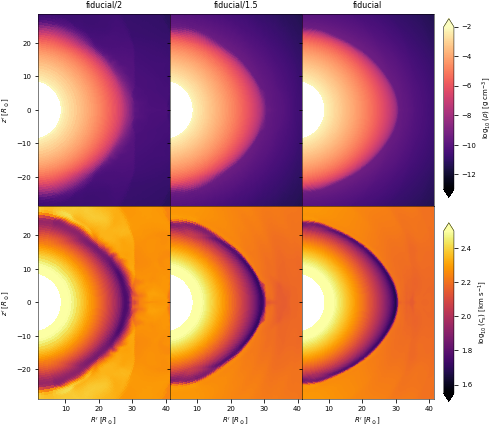

In [321]:
def makeplot(d):
    im=plt.pcolormesh(np.sqrt(d['x']**2 + d['y']**2)[0,:,:]/c.rsun,
               d['z'][0,:,:]/c.rsun,
               np.log10((d['rho'])[0,:,:]),
               cmap='magma',vmin=-13,vmax=-2,rasterized=True)
    plt.axis('equal')
    plt.xlim(0,3e12/c.rsun)
    plt.ylim(-2e12/c.rsun,2e12/c.rsun)
    #plt.xlabel(r"$R'$ [$R_\odot$]")
    plt.ylabel(r"$z'$ [$R_\odot$]")
    plt.xticks(visible=False)
    return im

def makeplotcs(d):
    im=plt.pcolormesh(np.sqrt(d['x']**2 + d['y']**2)[0,:,:]/c.rsun,
               d['z'][0,:,:]/c.rsun,
               np.log10(np.sqrt(1.35*d['press']/d['rho'])[0,:,:]/1.e5),
               cmap='inferno',rasterized=True,vmin=1.55,vmax=2.5)
    plt.axis('equal')
    plt.xlim(0,3e12/c.rsun)
    plt.ylim(-2e12/c.rsun,2e12/c.rsun)
    plt.xlabel(r"$R'$ [$R_\odot$]")
    plt.ylabel(r"$z'$ [$R_\odot$]")
    return im

fig,ax = plt.subplots(figsize=(180*fig_mm,180*fig_mm),ncols=3,nrows=2,sharey=True)

plt.subplot(231)
d = dl[0]
im=makeplot(d)
plt.title('fiducial/2',fontsize=8)

plt.subplot(234)
im2=makeplotcs(d)


plt.subplot(232)
d = dl[1]
makeplot(d)
plt.ylabel('')
plt.title('fiducial/1.5',fontsize=8)

plt.subplot(235)
im2=makeplotcs(d)
plt.ylabel('')

plt.subplot(233)
d = dl[2]
im=makeplot(d)
plt.ylabel('')
plt.title('fiducial',fontsize=8)

plt.subplot(236)
im2=makeplotcs(d)
plt.ylabel('')

plt.subplots_adjust(wspace=0,right=0.9,hspace=0)
cbar_ax_top = fig.add_axes([0.92, 0.52, 0.02, 0.35])
fig.colorbar(im, cax=cbar_ax_top,extend='both',label=r'$\log_{10}(\rho)$ [g cm$^{-3}$]')
cbar_ax_bottom = fig.add_axes([0.92, 0.12, 0.02, 0.35])
fig.colorbar(im2, cax=cbar_ax_bottom,extend='both',label=r'$\log_{10}(c_{\rm s})$ [km s$^{-1}$]')
plt.savefig("figs/2dhse.pdf",bbox_inches='tight',dpi=300)

In [322]:
filelist = [base_dir+"res/lr/HSE.out4.00001.athdf",
            base_dir+"res/mr/HSE.out4.00001.athdf",
            base_dir+"res/hr/HSE.out4.00001.athdf"]

mylevel=3
x2slicevalue=ou.get_midplane_theta(filelist[0],level=mylevel)

dl = []
for i,myfile in enumerate(filelist):
    dlev = []
    for ll in [0,1,2,3]:
        d = ou.read_data(myfile,orb,gamma=1.35,level=ll,x2_min=x2slicevalue,x2_max=x2slicevalue,
                           get_energy=False,profile_file=base_dir+'hse_profile.dat',x1_max=1e13)


        d['divV'] = divV_midplane(d)
        d['mach'] = np.sqrt( (d['vel1']**2 + d['vel2']**2 + d['vel3']**2) / (1.35*d['press']/d['rho']))
        d['mach_radial'] = np.sqrt( d['vel1']**2 / (1.35*d['press']/d['rho']))
        d['vort'] = vorticity_midplane(d)
        dlev.append(d)
    dl.append(dlev)

read_data...reading file ../machoHBdata/hrd/res/lr/HSE.out4.00001.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/res/lr/HSE.out4.00001.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/res/lr/HSE.out4.00001.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/res/lr/HSE.out4.00001.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/res/mr/HSE.out4.00001.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/res/mr/HSE.out4.00001.athdf
 ...file read, constructing arrays
 ...gamma= 1.35
...getting cartesian arrays...
read_data...reading file ../machoHBdata/hrd/res/mr/HSE.out4.00001.athdf
 ...

<ipython-input-323-6c7250f9a230>:28: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.

<ipython-input-323-6c7250f9a230>:52: RuntimeWarning:

invalid value encountered in log

<ipython-input-323-6c7250f9a230>:49: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



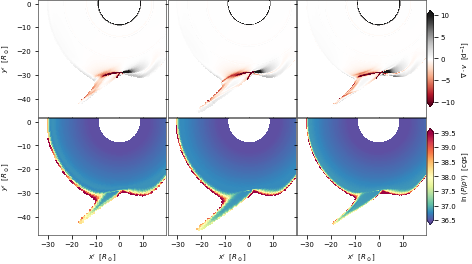

In [323]:


rhocontour = [-9.5]

lim=1.7e12
limr=5e12
centerx = -0.5e12
centery = -1.6e12

fig = plt.figure(figsize=(180*fig_mm,160*fig_mm))
grid = ImageGrid(fig,111,nrows_ncols=[2,3],
                 cbar_mode="edge",cbar_location='right')


#for i,myfile in enumerate(filelist):
    #d = ou.read_data(myfile,orb,gamma=1.35,level=mylevel,x2_min=x2slicevalue,x2_max=x2slicevalue,
    #                   get_energy=False,profile_file=base_dir+'hse_profile.dat')
    
    #d['divV'] = divV_midplane(d)
    #d['mach'] = np.sqrt( (d['vel1']**2 + d['vel2']**2 + d['vel3']**2) / (1.35*d['press']/d['rho']))
    #d['mach_radial'] = np.sqrt( d['vel1']**2 / (1.35*d['press']/d['rho']))

for i,dlev in enumerate(dl):
    d=dlev[2].copy()
    x2,y2,z2 = ou.pos_secondary(orb,d['Time'])
    rcom,vcom = ou.rcom_vcom(orb,d['Time'])

    ind = i
    for ll in [0,1,2,3]:
        im2=grid[ind].pcolormesh(ou.get_plot_array_midplane(dlev[ll]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[ll]['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane( np.where((dlev[ll]['Levels'][:,0,:] == ll) & (np.log10(dlev[ll]['rho'][:,0,:])>rhocontour),
                                              (dlev[ll]['divV'][:,0,:])*86400,
                                             np.nan)),
                    cmap='RdGy',shading='nearest',rasterized=True,vmin=-10,vmax=10  )
    
    
    cb2=plt.colorbar(im2,extend='both',cax=grid.cbar_axes[0],label=r'$\nabla \cdot v$  [d$^{-1}$] ')
    cb2.solids.set_edgecolor('face')

    grid[ind].add_patch(plt.Circle([x2/c.rsun,y2/c.rsun],radius=4,color='black') )
    grid[ind].set_xlim((centerx-1.1*lim)/c.rsun,(centerx+1.1*lim)/c.rsun)
    grid[ind].set_ylim((centery-lim)/c.rsun,(centery+lim)/c.rsun)

    grid[ind].set_xlabel("$x' \ \ [R_\odot]$")
    grid[ind].set_ylabel("$y' \ \ [R_\odot]$")
    #grid[ind].set_title(r"$t-t_{p}=$"+str(np.round((d['Time']-tperi)/86400.,1))+'d' ,fontdict={'fontsize':16}  )

        
    ind = i+3
    im1=grid[ind].pcolormesh(ou.get_plot_array_midplane(dlev[2]['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(dlev[2]['y'][:,0,:])/c.rsun,
                   #np.log10(d['rho'][:,0,:])) 
                   ou.get_plot_array_midplane(np.log(np.where(np.log10(dlev[2]['rho'][:,0,:])>rhocontour,dlev[2]['press'][:,0,:]/dlev[2]['rho'][:,0,:]**1.35,-99))),
                   cmap='Spectral_r',shading='nearest',vmin=36.5,vmax=39.5,rasterized=True)
    cb=plt.colorbar(im1,extend='both',cax=grid.cbar_axes[1],label=r'$\ln\left( P/\rho^{\gamma} \right)$  [cgs]')
    cb.solids.set_edgecolor('face')

    grid[ind].add_patch(plt.Circle([x2/c.rsun,y2/c.rsun],radius=4,color='black') )
    grid[ind].set_xlim((centerx-1.1*lim)/c.rsun,(centerx+1.1*lim)/c.rsun)
    grid[ind].set_ylim((centery-lim)/c.rsun,(centery+lim)/c.rsun)

    grid[ind].set_xlabel("$x' \ \ [R_\odot]$")
    grid[ind].set_ylabel("$y' \ \ [R_\odot]$")
    

plt.savefig("figs/convergence_shock_peri_lower.pdf",dpi=300,bbox_inches='tight')

<ipython-input-325-daf3478a392d>:26: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



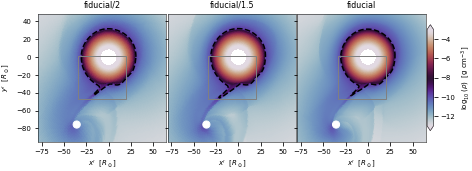

In [325]:


rhocontour = [-9.5]

limr=5e12
centerx = -0.5e12
centery = -1.6e12

fig = plt.figure(figsize=(180*fig_mm,90*fig_mm))
grid = ImageGrid(fig,111,nrows_ncols=[1,3],
                 cbar_mode="edge",cbar_location='right')


#for i,myfile in enumerate(filelist):
    #d = ou.read_data(myfile,orb,gamma=1.35,level=mylevel,x2_min=x2slicevalue,x2_max=x2slicevalue,
    #                   get_energy=False,profile_file=base_dir+'hse_profile.dat')
    
    #d['divV'] = divV_midplane(d)
    #d['mach'] = np.sqrt( (d['vel1']**2 + d['vel2']**2 + d['vel3']**2) / (1.35*d['press']/d['rho']))
    #d['mach_radial'] = np.sqrt( d['vel1']**2 / (1.35*d['press']/d['rho']))

for i,dlev in enumerate(dl):
    d=dlev[2].copy()
    x2,y2,z2 = ou.pos_secondary(orb,d['Time'])
    rcom,vcom = ou.rcom_vcom(orb,d['Time'])

    ind = i
    im0=grid[ind].pcolormesh(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                   #np.log10(d['rho'][:,0,:])) 
                   ou.get_plot_array_midplane(np.log10(np.where(d['r0'][:,0,:]>0,d['rho'][:,0,:],-99))),
                   cmap='twilight',vmin=-13,vmax=-3,shading='nearest',rasterized=True)
    cb=plt.colorbar(im0,extend='both',cax=grid.cbar_axes[0],label=r'$\log_{10}\left(\rho\right)$  [g cm$^{-3}$]')
    cb.solids.set_edgecolor('face')
    
    grid[ind].contour(ou.get_plot_array_midplane(d['x'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(d['y'][:,0,:])/c.rsun,
                   ou.get_plot_array_midplane(np.log10(d['rho'][:,0,:]) ),
                   levels=rhocontour,colors='k',linestyles='--',zorder=1)

    grid[ind].add_patch(plt.Circle([x2/c.rsun,y2/c.rsun],radius=4,color='white') )
    grid[ind].set_xlim((centerx-limr)/c.rsun,(centerx+limr)/c.rsun)
    grid[ind].set_ylim((centery-limr)/c.rsun,(centery+limr)/c.rsun)

    grid[ind].set_xlabel("$x' \ \ [R_\odot]$")
    grid[ind].set_ylabel("$y' \ \ [R_\odot]$")
    #grid[ind].set_title(r"$t-t_{p}=$"+str(np.round((d['Time']-tperi)/86400.,1))+'d' ,fontdict={'fontsize':16}  )
    grid[ind].add_patch(Rectangle(((centerx-1.1*lim)/c.rsun,(centery-lim)/c.rsun),2.2*lim/c.rsun,2*lim/c.rsun,linewidth=1,edgecolor='grey',facecolor='none'))

    
grid[0].set_title('fiducial/2',fontdict={'fontsize':8} )
grid[1].set_title('fiducial/1.5',fontdict={'fontsize':8} )
grid[2].set_title('fiducial',fontdict={'fontsize':8} )
plt.savefig("figs/convergence_shock_peri_upper.pdf",dpi=300,bbox_inches='tight')

In [12]:
m = dd.io.load(base_dir+"mesh_00590_rho1e-9.5.h5")

m

{'areas': array([1.05420622e+20, 5.45152060e+19, 2.28359968e+20, ...,
        3.07080689e+20, 2.75536998e+19, 2.55263817e+19]),
 'centroids': array([[-3.29197218e+12, -5.11854919e+12, -2.94182649e+10],
        [-3.29197218e+12, -5.11854919e+12, -2.56739588e+10],
        [-3.29317860e+12, -5.09253066e+12, -2.94182649e+10],
        ...,
        [ 2.27553025e+12, -3.83500557e+11,  1.37484649e+11],
        [ 2.27458662e+12, -3.45337867e+11,  1.31364259e+11],
        [ 2.27458662e+12, -3.45337867e+11,  1.36013001e+11]]),
 'faces': array([[    2,     1,     0],
        [    0,     3,     2],
        [    0,     1,     4],
        ...,
        [36408, 36543, 36542],
        [36543, 36427, 36416],
        [36427, 36543, 36418]], dtype=int32),
 'normals': array([[-0.92978888, -0.11390757, -0.3500253 ],
        [-0.73063712, -0.08950967,  0.67687326],
        [-0.93582652, -0.01070968, -0.35229822],
        ...,
        [ 0.96854745,  0.03282385,  0.24665447],
        [ 0.98138521,  0.13375694, 

In [117]:
def save_obj(mesh, filename):
    """
    Saves the given vertices and faces to a .obj file.

    Args:
        mesh, contains:
            mesh['verts'] --  A list of vertices, each of which is represented by a list of three floats.
            mesh['faces'] -- A list of faces, each of which is represented by a list of three integers.
        filename: The name of the .obj file to save to.
    """
    # do some cleaning
    #sel = ~np.isnan(np.linalg.norm(m['verts'][m['faces']],axis=1))
    #myverts = mesh['verts'][m['faces']][sel]
    #myfaces = np.reshape( m['faces'][sel], (int(len(m['faces'][sel])/3), 3) )
    myverts = m['verts']
    myfaces = m['faces']+1
    
    with open(filename, "w") as f:
        
        
        for vertex in myverts:
            f.write("v {} {} {}\n".format(*vertex) )
        for face in myfaces:
            f.write("f {} {} {}\n".format(*face) )
    
    return 


m = dd.io.load(base_dir+"mesh_00590_rho1e-9.5.h5")
save_obj(m,"../test.obj")

In [59]:
m['verts'][m['faces']-1].shape

(73080, 3, 3)

In [74]:
sel = ~np.isnan(np.linalg.norm(m['verts'][m['faces']-1],axis=1))
m['verts'][m['faces']-1][sel]

array([[-3.29096990e+12, -5.13491178e+12, -2.67558528e+10],
       [-3.29096990e+12, -5.11036789e+12, -3.47430889e+10],
       [-3.29397675e+12, -5.11036789e+12, -2.67558528e+10],
       ...,
       [ 2.27424749e+12, -3.40361426e+11,  1.33779264e+11],
       [ 2.27526488e+12, -3.47826087e+11,  1.33779264e+11],
       [ 2.27424749e+12, -3.47826087e+11,  1.40480475e+11]])

array([[    3,     2,     1],
       [    1,     4,     3],
       [    1,     2,     5],
       ...,
       [36409, 36544, 36543],
       [36544, 36428, 36417],
       [36428, 36544, 36419]], dtype=int32)

In [123]:
m['verts'].shape

(36544, 3)

In [124]:
36544 *3

109632

In [130]:
m['verts'].shape ,  m['faces'].shape

((36544, 3), (73080, 3))

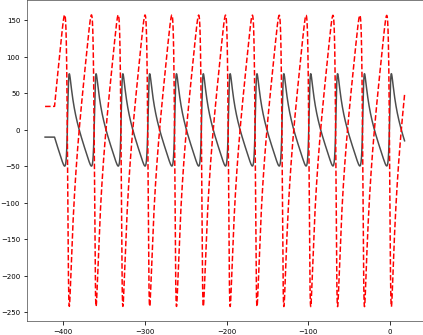

In [17]:
n0 = np.array([1,-0.4,0.5])
n0 = n0/np.linalg.norm(n0)

vprim = -orb['vcom']
vsec = orb['v']-orb['vcom']
vlosp = np.dot(vprim,-n0)
vloss = np.dot(vsec, -n0)
plt.plot((orb['time']-tperi)/86400,vlosp/1.e5,ls='-',color='0.3',label='primary COM')
plt.plot((orb['time']-tperi)/86400,vloss/1.e5,ls='--',color='r',label='secondary')

In [28]:
print('t-tperi (d)  , vprimary (km/s) , vsecondary (km/s)')
for myd in range(-10,11):
    print(myd,np.round( np.interp(myd,(orb['time']-tperi)/86400,vlosp/1.e5), 1) ,
          np.round( np.interp(myd,(orb['time']-tperi)/86400,vloss/1.e5),1) )

t-tperi (d)  , vprimary (km/s) , vsecondary (km/s)
-10 -33.1 104.4
-9 -36.5 115.3
-8 -39.9 126.0
-7 -43.2 136.3
-6 -46.2 145.7
-5 -48.5 153.2
-4 -49.6 156.5
-3 -47.5 149.9
-2 -37.8 119.2
-1 -10.6 33.5
0 38.0 -120.0
1 72.0 -227.4
2 75.9 -239.6
3 68.4 -215.7
4 58.9 -185.8
5 49.9 -157.5
6 41.9 -132.2
7 34.7 -109.6
8 28.3 -89.4
9 22.5 -71.1
10 17.2 -54.3
